### About Deodorant data

+ The data has survey results of 5 deodorants with 63 attributes contaning several information. 
+ It contains Instant Liking as the target variable(dependent variable).
+ The first few words uttered by the user after using the particular product for the first time positive or negative. 

### Like:
+ Strength of the Deo (On a scale of 1 to 5)
+ Is the Deo addicitive (On a scale of 1 to 5)

### Problem Statement :
+ It's a classification problem with the target variable taking two values.
+ Classifying if Deodorant is instantly likable or not.

<a id="1"></a>
### <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:4px 4px;">Import the libraries</p>

In [33]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import seaborn as sns
from scipy.stats import skew
from sklearn import preprocessing
import scipy.stats
from scipy.stats import chi2
from termcolor import colored, cprint
from scipy.stats import pearsonr
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.ensemble import VotingClassifier ,BaggingClassifier, AdaBoostClassifier,GradientBoostingClassifier
from numpy import mean,std
import xgboost as xgb
from sklearn.feature_selection import SelectKBest,f_regression
from sklearn.base import BaseEstimator,clone,TransformerMixin,RegressorMixin

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import RepeatedStratifiedKFold,cross_val_score,RandomizedSearchCV,GridSearchCV
from pprint import pprint
from sklearn import tree
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
# Stop warnings
import warnings
warnings.filterwarnings("ignore")

<a id="1"></a>
### <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:4px 4px;">1. Importing the Dataset</p>

In [34]:
Data = pd.read_csv("Data_train_reduced.csv")

### Header information of Data

In [35]:
Data.shape

(2500, 64)

+ Dataset contains total 64 columns
+ There is one target variable(dependent) and the 63 attributes(independent)
+ Total 2500 data objects are in the dataset.

### Counts of non-null data and their types within the attributes

In [36]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 64 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Respondent.ID                                            2500 non-null   int64  
 1   Product.ID                                               2500 non-null   int64  
 2   Product                                                  2500 non-null   object 
 3   Instant.Liking                                           2500 non-null   int64  
 4   q1_1.personal.opinion.of.this.Deodorant                  2500 non-null   int64  
 5   q2_all.words                                             2500 non-null   int64  
 6   q3_1.strength.of.the.Deodorant                           2500 non-null   int64  
 7   q4_1.artificial.chemical                                 2500 non-null   int64  
 8   q4_2.attractive             

### Target Variable of the data

In [37]:
attributes = Data.keys()
attributes[3]

'Instant.Liking'

### Attributes of the data

In [38]:
attributes = np.delete(attributes,3)
attributes[:]

Index(['Respondent.ID', 'Product.ID', 'Product',
       'q1_1.personal.opinion.of.this.Deodorant', 'q2_all.words',
       'q3_1.strength.of.the.Deodorant', 'q4_1.artificial.chemical',
       'q4_2.attractive', 'q4_3.bold', 'q4_4.boring', 'q4_5.casual',
       'q4_6.cheap', 'q4_7.clean', 'q4_8.easy.to.wear', 'q4_9.elegant',
       'q4_10.feminine', 'q4_11.for.someone.like.me', 'q4_12.heavy',
       'q4_13.high.quality', 'q4_14.long.lasting', 'q4_15.masculine',
       'q4_16.memorable', 'q4_17.natural', 'q4_18.old.fashioned',
       'q4_19.ordinary', 'q4_20.overpowering', 'q4_21.sharp',
       'q4_22.sophisticated', 'q4_23.upscale', 'q4_24.well.rounded',
       'q5_1.Deodorant.is.addictive', 'q7', 'q8.1', 'q8.2', 'q8.5', 'q8.6',
       'q8.7', 'q8.8', 'q8.9', 'q8.10', 'q8.11', 'q8.12', 'q8.13', 'q8.17',
       'q8.18', 'q8.19', 'q8.20',
       'q9.how.likely.would.you.be.to.purchase.this.Deodorant',
       'q10.prefer.this.Deodorant.or.your.usual.Deodorant',
       'q11.time.of.day.would

### Data Enteries in colums

In [39]:
indexes = Data.columns
for index in indexes:
    print(Data[index].value_counts())
    print('\n')

3800    1
9570    1
9563    1
9564    1
9565    1
       ..
8333    1
8334    1
8335    1
8336    1
5699    1
Name: Respondent.ID, Length: 2500, dtype: int64


121    500
633    500
974    500
344    500
230    500
Name: Product.ID, dtype: int64


Deodorant B    500
Deodorant F    500
Deodorant G    500
Deodorant H    500
Deodorant J    500
Name: Product, dtype: int64


0    1882
1     618
Name: Instant.Liking, dtype: int64


6    804
5    707
7    371
4    315
3    107
1    105
2     91
Name: q1_1.personal.opinion.of.this.Deodorant, dtype: int64


1    1003
0     709
2     587
3     179
4      21
5       1
Name: q2_all.words, dtype: int64


3    1627
4     525
5     238
2      80
1      30
Name: q3_1.strength.of.the.Deodorant, dtype: int64


1    804
2    612
3    423
4    352
5    309
Name: q4_1.artificial.chemical, dtype: int64


5    856
4    769
3    420
1    234
2    221
Name: q4_2.attractive, dtype: int64


4    812
5    664
3    490
2    293
1    241
Name: q4_3.bold, dtype: int

<a id="1"></a>
### <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">2. Knowing the Data and Data Cleaning</p>

### (a) Removing duplicated values

+ This can create redundancy in the data
+ Checking and removing duplicate Values

In [40]:
Data.duplicated().sum()

0

+ There is no duplicated data i.e. no rows are identical in this data

### (b) Dealing with Missing Data(Attribute values missing)

In [41]:
MS_Data = Data.isna().sum()
MS_Values = MS_Data.values
MS_Keys = MS_Data.keys()
print(f'Attribute Column       Number of Missing values:')
for i in range(len(MS_Values)):
    V = MS_Values[i]
    if V>0:
        Keys_Missing = MS_Keys[i]
        print(f'      {Keys_Missing}                      {V}') 

Attribute Column       Number of Missing values:
      q8.2                      1000
      q8.7                      500
      q8.8                      2000
      q8.9                      2000
      q8.10                      2000
      q8.12                      500
      q8.17                      2000
      q8.18                      1500
      q8.20                      1000


### Note :
+ The original data contains total 2500 rows.
+ And we can see that attribute columns q8.2, q8.7, q8.8, q8.9, q8.10, q8.12, q8.17, q8.18, q8.20 contaning more than 500 missing values
+ Some columns contain 80% of the data missing so it's difficult to fill these with only 20% of the informations.
+ Better options is that we drop these columns

### Removing the missing value columns and the irrelevant columns
+ Missing Value Columns : 'q8.8','q8.9','q8.10','q8.12','q8.13','q8.17','q8.18','q8.20'
+ Irrelevant Columns : 'q8.1','q8.5','q8.6','q8.11','q7','q8.2','q8.7','s13.2','q8.19', 
+ Irrelevant Columns are not meaningful columns because they are not present in the test data we are given. So in case if we create ML model including those attributes, then it won't be useful in classifying the unseen test data given to us. So we drop those Irrelevant attribute columns.
+ Same value columns : 's7.involved.in.the.selection.of.the.cosmetic.products'

In [42]:
MissingValue_colums    = ['q8.8','q8.9','q8.10','q8.12','q8.13','q8.17','q8.18','q8.20']

Irrelevant_colums = ['q8.1','q8.5','q8.6','q8.11','q7','q8.2','q8.7','s13.2','q8.19',
                         's7.involved.in.the.selection.of.the.cosmetic.products']

Data_f = Data.copy()
Data_f = Data_f.drop(MissingValue_colums,axis = 1)
Data_f = Data_f.drop(Irrelevant_colums,axis = 1)
Data_f.head()

,Respondent.ID,Product.ID,Product,Instant.Liking,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,...,Q13_Liking.after.30.minutes,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own
0,3800,121,Deodorant B,1,4,1,4,2,5,4,...,1,7,7,1,4,3,1,1,0,3
1,3801,121,Deodorant B,0,5,1,4,4,2,2,...,3,8,6,1,4,3,1,1,0,4
2,3802,121,Deodorant B,0,6,1,3,2,5,2,...,2,5,7,1,3,5,1,1,0,2
3,3803,121,Deodorant B,1,4,0,4,5,5,4,...,6,8,1,1,4,9,1,3,0,3
4,3804,121,Deodorant B,1,4,1,2,1,3,1,...,5,4,4,1,3,5,1,2,0,3


### Recounting nun-null values

In [43]:
Data_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 46 columns):
 #   Column                                                   Non-Null Count  Dtype 
---  ------                                                   --------------  ----- 
 0   Respondent.ID                                            2500 non-null   int64 
 1   Product.ID                                               2500 non-null   int64 
 2   Product                                                  2500 non-null   object
 3   Instant.Liking                                           2500 non-null   int64 
 4   q1_1.personal.opinion.of.this.Deodorant                  2500 non-null   int64 
 5   q2_all.words                                             2500 non-null   int64 
 6   q3_1.strength.of.the.Deodorant                           2500 non-null   int64 
 7   q4_1.artificial.chemical                                 2500 non-null   int64 
 8   q4_2.attractive                       

### Note : 
+ Now we have total 45 nominal attributes left now
+ 1 Target variable 

### Re-visualising Data Enteries in colums

In [44]:
indexes = Data_f.columns
for index in indexes:
    print(Data_f[index].value_counts())
    print('\n')

3800    1
9570    1
9563    1
9564    1
9565    1
       ..
8333    1
8334    1
8335    1
8336    1
5699    1
Name: Respondent.ID, Length: 2500, dtype: int64


121    500
633    500
974    500
344    500
230    500
Name: Product.ID, dtype: int64


Deodorant B    500
Deodorant F    500
Deodorant G    500
Deodorant H    500
Deodorant J    500
Name: Product, dtype: int64


0    1882
1     618
Name: Instant.Liking, dtype: int64


6    804
5    707
7    371
4    315
3    107
1    105
2     91
Name: q1_1.personal.opinion.of.this.Deodorant, dtype: int64


1    1003
0     709
2     587
3     179
4      21
5       1
Name: q2_all.words, dtype: int64


3    1627
4     525
5     238
2      80
1      30
Name: q3_1.strength.of.the.Deodorant, dtype: int64


1    804
2    612
3    423
4    352
5    309
Name: q4_1.artificial.chemical, dtype: int64


5    856
4    769
3    420
1    234
2    221
Name: q4_2.attractive, dtype: int64


4    812
5    664
3    490
2    293
1    241
Name: q4_3.bold, dtype: int

## (c). Basic Statistical descriptions of the data

In [45]:
Data_f.describe()

,Respondent.ID,Product.ID,Instant.Liking,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,...,Q13_Liking.after.30.minutes,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own
count,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,...,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000
mean,8249.500000,460.400000,0.24720,5.129600,1.121200,3.344400,2.500000,3.71680,3.546000,2.241600,...,4.959600,6.746800,3.522400,1.665200,3.199200,4.996000,1.742000,1.898000,0.038400,3.072000
std,3433.008516,308.412528,0.43147,1.481918,0.934055,0.743243,1.384618,1.27548,1.261951,1.242838,...,1.769073,2.505274,1.964241,1.036889,0.970307,2.371125,0.726944,1.440426,0.192198,1.620082
min,3800.000000,121.000000,0.00000,1.000000,0.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,0.000000,1.000000
25%,5324.750000,230.000000,0.00000,5.000000,0.000000,3.000000,1.000000,3.00000,3.000000,1.000000,...,4.000000,5.000000,2.000000,1.000000,2.000000,3.000000,1.000000,1.000000,0.000000,2.000000
50%,8249.500000,344.000000,0.00000,5.000000,1.000000,3.000000,2.000000,4.00000,4.000000,2.000000,...,5.000000,7.000000,3.000000,1.000000,3.000000,4.000000,2.000000,1.000000,0.000000,3.000000
75%,9774.250000,633.000000,0.00000,6.000000,2.000000,4.000000,4.000000,5.00000,5.000000,3.000000,...,6.000000,9.000000,5.000000,2.000000,4.000000,7.000000,2.000000,2.000000,0.000000,4.000000
max,14099.000000,974.000000,1.00000,7.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,...,7.000000,10.000000,7.000000,5.000000,7.000000,10.000000,5.000000,7.000000,1.000000,6.000000


## (d). Histogram Plots

In [46]:
## When the attributes are categorical or nominal
def Histogramplot(attribute,dataset):
    for i in range(len(attribute)):
        var = str(attribute[i])
        plt.figure(figsize=(10,2),dpi=100)
        sns.countplot(data=dataset,x = f'{var}',hue='Instant.Liking',palette='viridis')
        plt.title(f'Bargraph of {var}')

#### Visualization of the ordinal attributes 
+ Attributes with its maping to the counting numbers from 1-5, 1-3, 1-7 or 1-10

In [47]:
attributes = Data_f.keys()
attributes = np.delete(attributes,0)
attributes = np.delete(attributes,0)
attributes = np.delete(attributes,0)
attributes = np.delete(attributes,0)
attributes[:]

Index(['q1_1.personal.opinion.of.this.Deodorant', 'q2_all.words',
       'q3_1.strength.of.the.Deodorant', 'q4_1.artificial.chemical',
       'q4_2.attractive', 'q4_3.bold', 'q4_4.boring', 'q4_5.casual',
       'q4_6.cheap', 'q4_7.clean', 'q4_8.easy.to.wear', 'q4_9.elegant',
       'q4_10.feminine', 'q4_11.for.someone.like.me', 'q4_12.heavy',
       'q4_13.high.quality', 'q4_14.long.lasting', 'q4_15.masculine',
       'q4_16.memorable', 'q4_17.natural', 'q4_18.old.fashioned',
       'q4_19.ordinary', 'q4_20.overpowering', 'q4_21.sharp',
       'q4_22.sophisticated', 'q4_23.upscale', 'q4_24.well.rounded',
       'q5_1.Deodorant.is.addictive',
       'q9.how.likely.would.you.be.to.purchase.this.Deodorant',
       'q10.prefer.this.Deodorant.or.your.usual.Deodorant',
       'q11.time.of.day.would.this.Deodorant.be.appropriate',
       'q12.which.occasions.would.this.Deodorant.be.appropriate',
       'Q13_Liking.after.30.minutes',
       'q14.Deodorant.overall.on.a.scale.from.1.to.10', 'Val

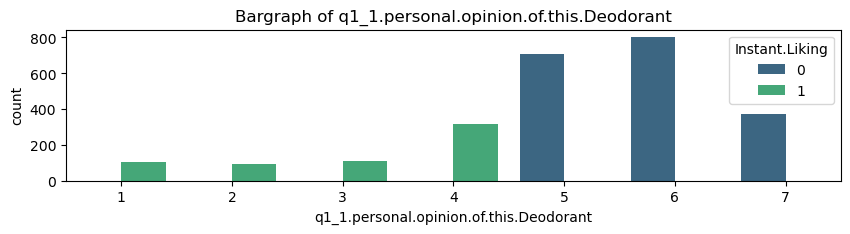

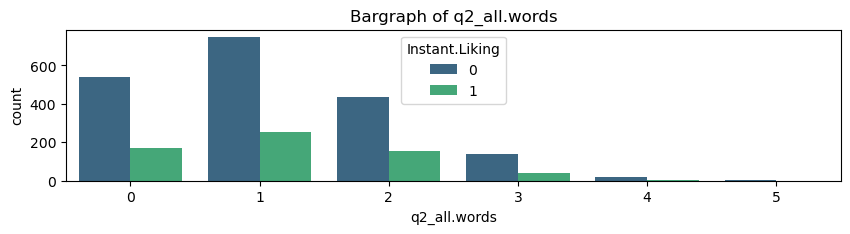

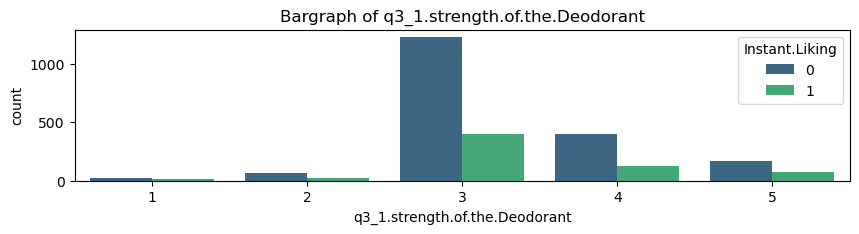

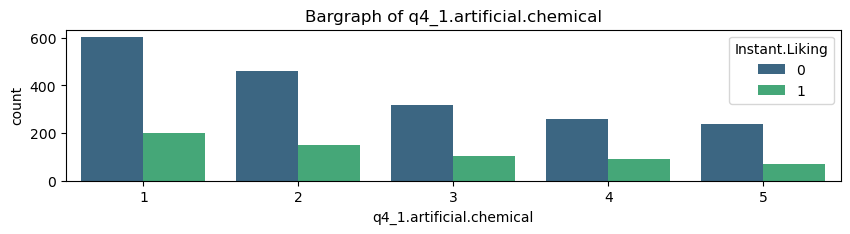

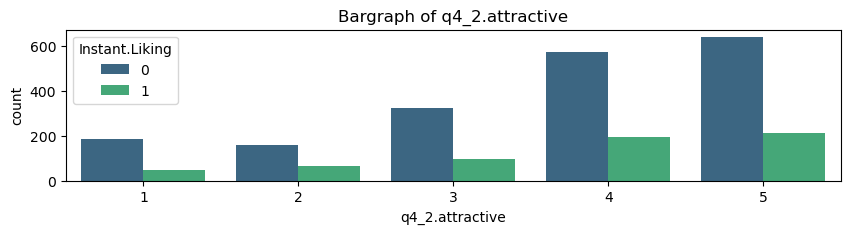

...

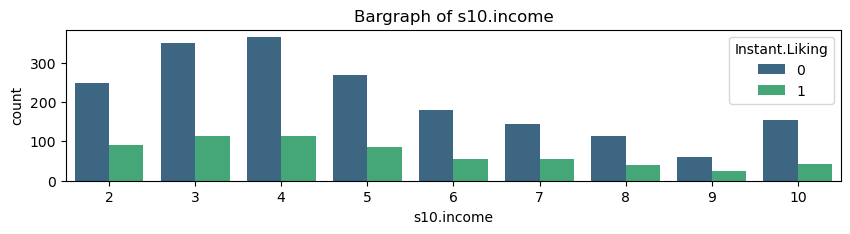

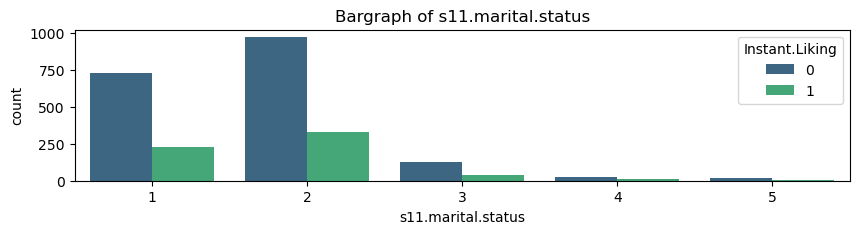

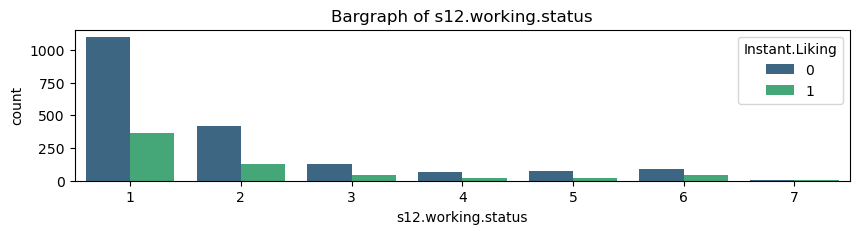

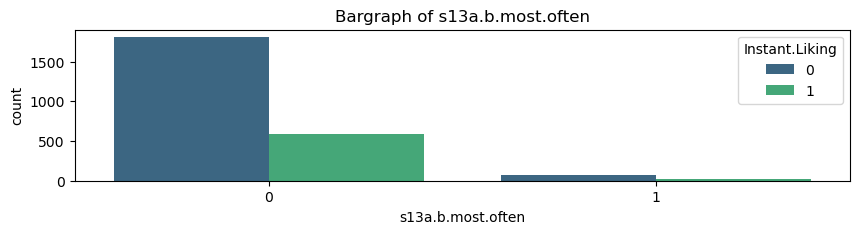

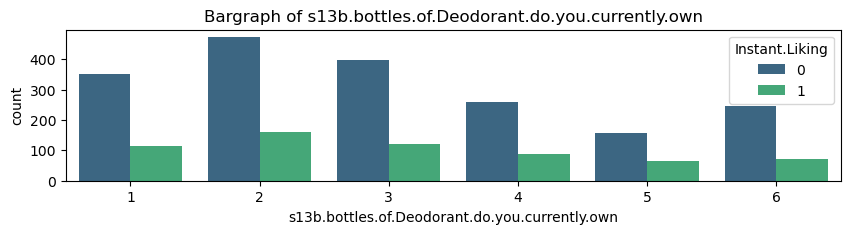

In [48]:
Histogramplot(attributes,Data_f)

#### Visualization of the Categorical attributes

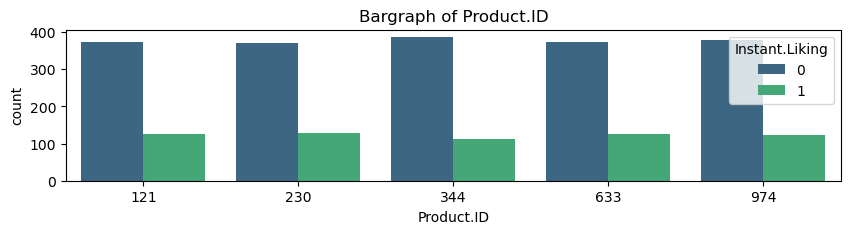

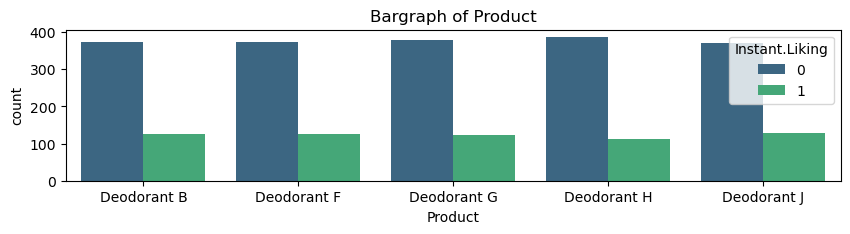

In [49]:
attribute1 = ['Product.ID','Product']
Histogramplot(attribute1,Data_f)

### Insights from the histogram :
+ All the product.IDs have nearly equal ratio of likes and dislikes
+ More reviews are made in the case of dislikes than likes when rating is less than 5

+ When the strength of the following increases then the number of dislikes and likes both decreases in equal ratios :
  - artificial chemical
  - boringness
  - cheapness
  - masculineness
  - old_fashioned

+ As the product made more attractive the number of dislikes first decreases and then increases, but number of the likes increases

+ When the strength of the following increases the number of the dislikes and likes both increases :
   - cleanness
   - long lasting
   - sophisticated
   - upscaling
   - comfortness in wear
   - elegent
   - casual
   - Memorable
   - Feminine 
   - attractive

+ When the product made more heavy number of the dislikes and likes both first decreases then increases 

+ When the strength of the following increases then the number of the dislikes and likes both first increases then decreases :
  - quality
  - naturality
  - ordinary 
  - sharpness 
  - well rounded 
  - addictiveness 
  - boldness

+ The number of the dislikes and likes both are independent of overpowering

## (e). Distribution of the attributes of the data using violin and box-plot

In [50]:
attribute2 = Data_f.keys()
attribute2 = np.delete(attribute2,[0,3])

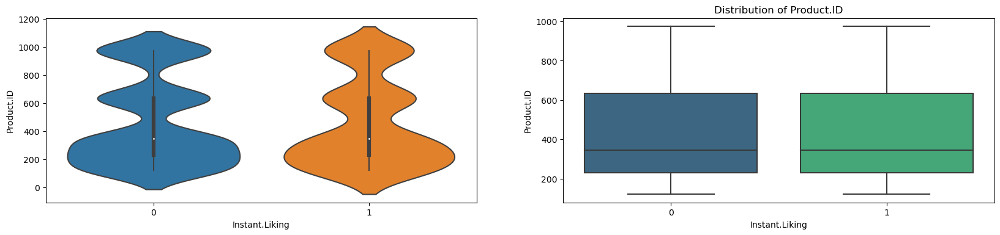

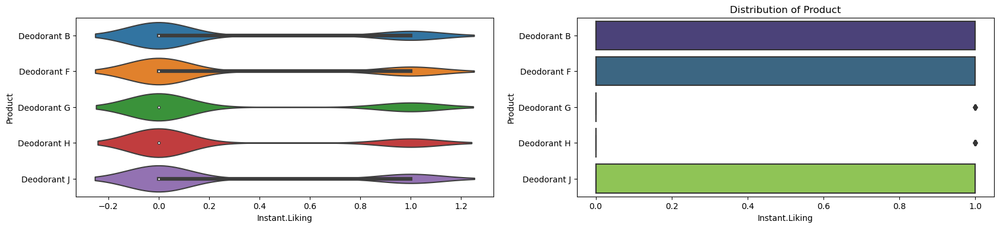

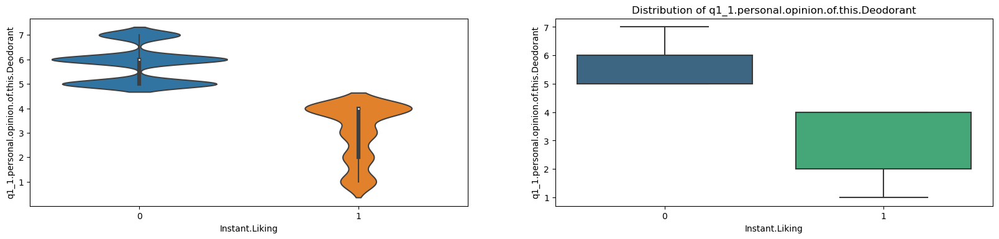

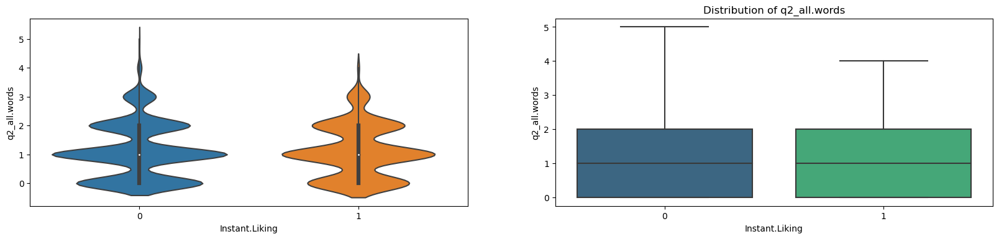

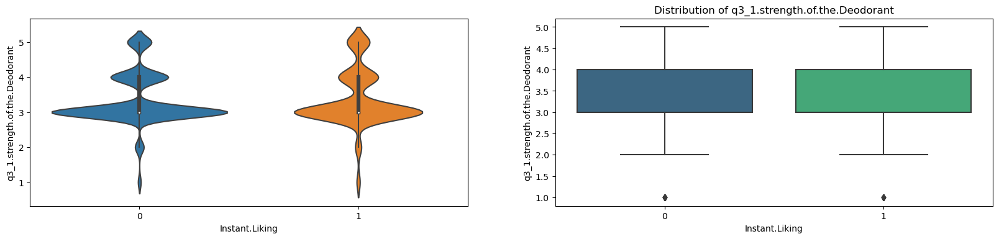

...

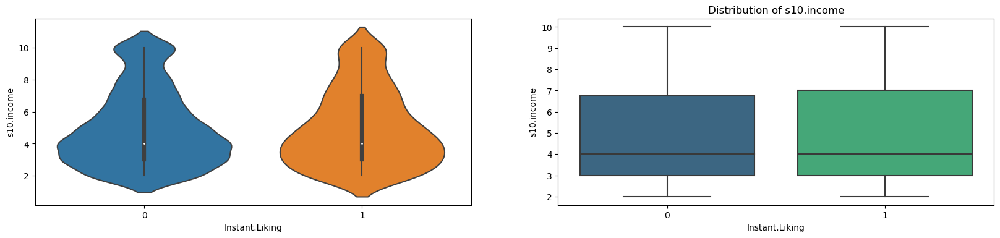

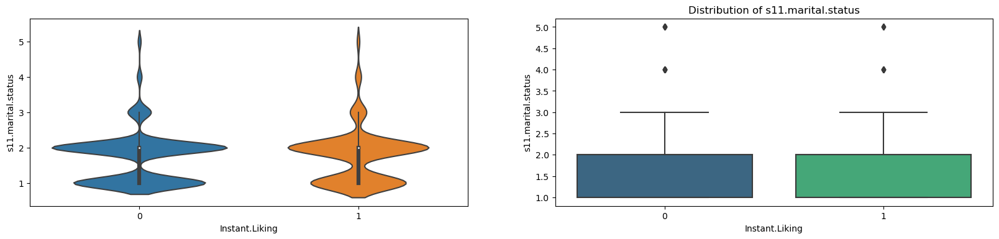

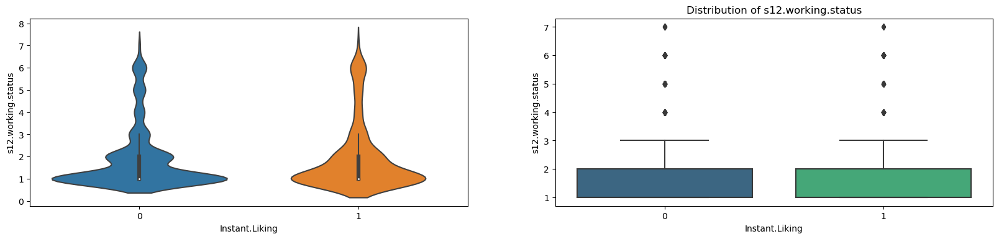

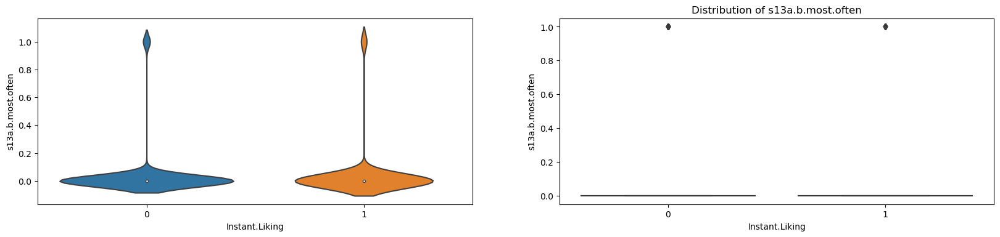

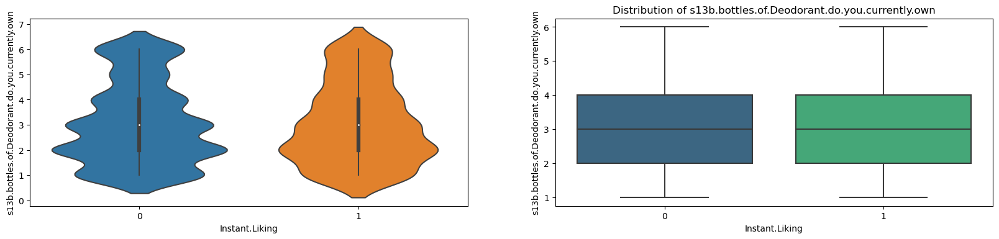

In [51]:
for i in range(len(attribute2)):
    var = str(attribute2[i])
    plt.figure(figsize=(20,4),dpi=100)
    plt.subplot(1,2,1)
    sns.violinplot(y = Data_f[f'{var}'],x=Data_f['Instant.Liking'])
    plt.subplot(1,2,2)
    sns.boxplot(data=Data_f,x = 'Instant.Liking', y = f'{var}', palette='viridis')
    plt.title(f'''Distribution of {var}''')

## (f). Outlier detection and its removal
### Why we are removing the outliers ?
+ Our model will try to learn outliers ( not following the general trend of the data ) data also and will result in junk model

### Detecting Outliers

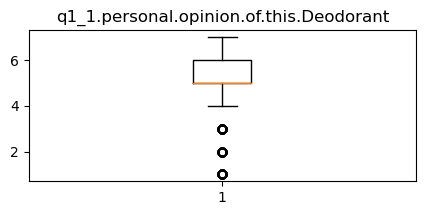

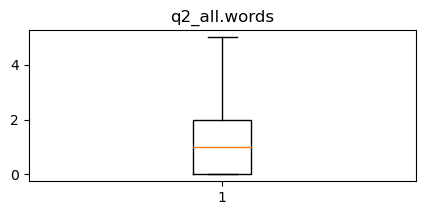

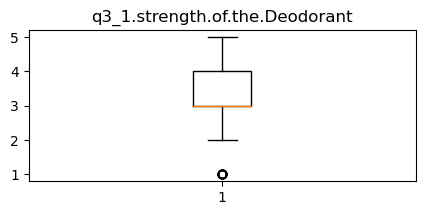

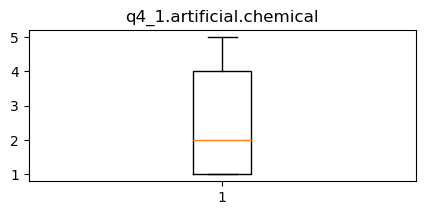

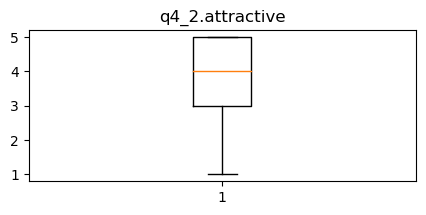

...

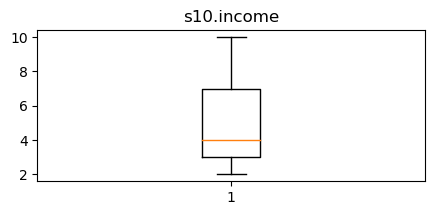

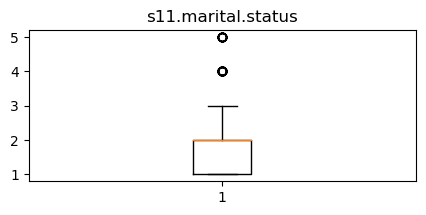

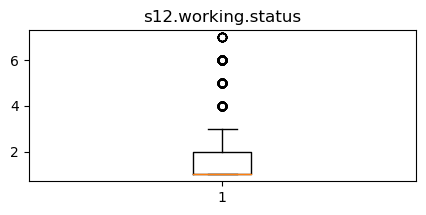

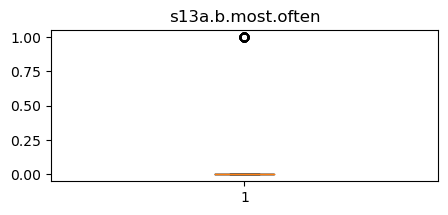

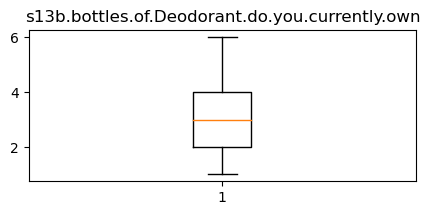

In [52]:
for i in range(len(attributes)):
    col = attributes[i]
    plt.figure(figsize=(5,2),dpi=100)
    plt.boxplot(Data_f[col]) 
    plt.title(col)

#### Attributes with respect to which the data has outliers :
+ 'q1_1.personal.opinion.of.this.Deodorant',
+ 'q3_1.strength.of.the.Deodorant',
+ 'q4_10.feminine',
+ 's8.ethnic.background',
+ 's11.marital.status',
+ 's12.working.status',
+ 's13a.b.most.often'

### Method 1 : Box-plot
+ Removing outliers by droping the corresponding rows

In [53]:
# Function to remove outlier in a single variable

def Outlier_Removal(Data,var):
    Q1 = np.percentile(Data[f'{var}'], 25,interpolation = 'midpoint')
    Q3 = np.percentile(Data[f'{var}'], 75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    
    upper = Q3+1.5*IQR
    lower = Q1-1.5*IQR
    
    # Removing the Outliers
    mask = (Data[f'{var}']<=upper) & (Data[f'{var}']>=lower)
    Data = Data[mask]
    return Data

# Function to give updated data after removing outlier in a single attribute
def Final_Data(Data,var):
    ds = Data
    ds  = Outlier_Removal(ds,var)
    return ds

# Final updated data after removing outlier in all the attributes
Cleaned_Data = Data_f.copy()
for i in range(len(attributes)):
    var = attributes[i]
    Cleaned_Data  = Final_Data(Cleaned_Data,var) 
    
Final_Data = Cleaned_Data.reset_index()
Final_Data = Final_Data.drop(['index'],axis = 1)
Final_Data

,Respondent.ID,Product.ID,Product,Instant.Liking,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,...,Q13_Liking.after.30.minutes,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own
0,3800,121,Deodorant B,1,4,1,4,2,5,4,...,1,7,7,1,4,3,1,1,0,3
1,3801,121,Deodorant B,0,5,1,4,4,2,2,...,3,8,6,1,4,3,1,1,0,4
2,3802,121,Deodorant B,0,6,1,3,2,5,2,...,2,5,7,1,3,5,1,1,0,2
3,3803,121,Deodorant B,1,4,0,4,5,5,4,...,6,8,1,1,4,9,1,3,0,3
4,3804,121,Deodorant B,1,4,1,2,1,3,1,...,5,4,4,1,3,5,1,2,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1423,5691,230,Deodorant J,1,4,3,4,1,2,3,...,1,3,5,3,3,5,3,1,0,1
1424,5692,230,Deodorant J,1,4,1,5,2,5,4,...,4,7,5,1,4,3,2,3,0,2
1425,5696,230,Deodorant J,0,5,0,3,1,4,1,...,7,6,3,1,2,9,2,1,0,2
1426,5698,230,Deodorant J,0,5,2,4,2,3,4,...,1,7,2,1,3,5,3,2,0,4


**Re-visualization of the data using Box-plots after outlier removal**

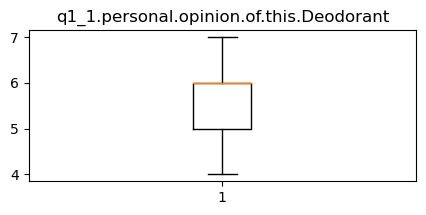

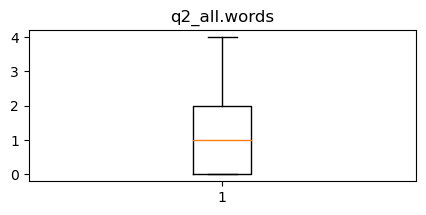

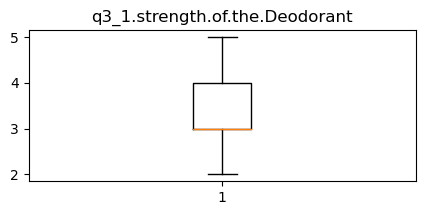

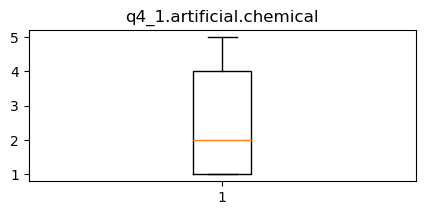

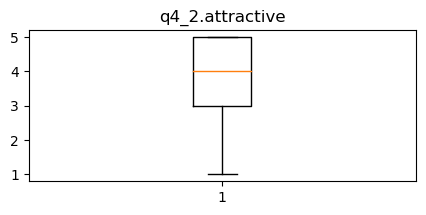

...

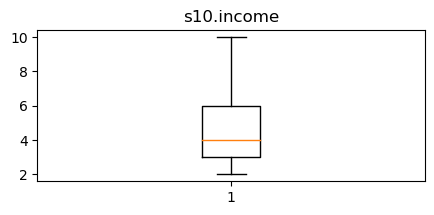

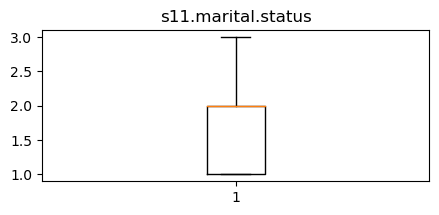

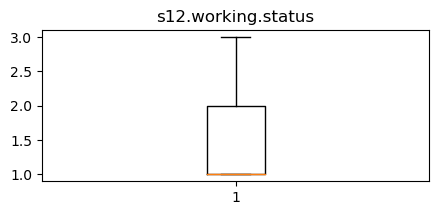

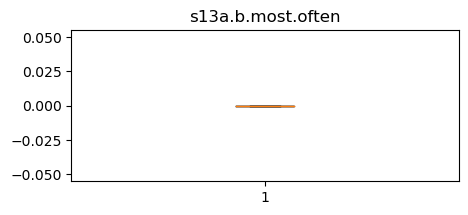

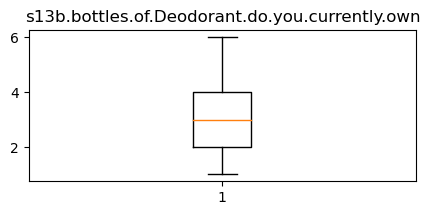

In [54]:
for i in range(len(attributes)):
    col = attributes[i]
    plt.figure(figsize=(5,2),dpi=100)
    plt.boxplot(Final_Data[col]) 
    plt.title(col)

In [55]:
Data['Instant.Liking'].value_counts()

0    1882
1     618
Name: Instant.Liking, dtype: int64

In [56]:
Final_Data['Instant.Liking'].value_counts()

0    1222
1     206
Name: Instant.Liking, dtype: int64

#### Problem of data loss :
+ We originally had 2500 data points
+ After removing the outliers we get 1445 data points 
+ We lost almost 1055 data points because of outliers
+ Less data will not give good model as it need sufficient data points to learn both class well
+ Therefore removing data objects that are outliers, is not a good approach.

### Method 2 : Clustering

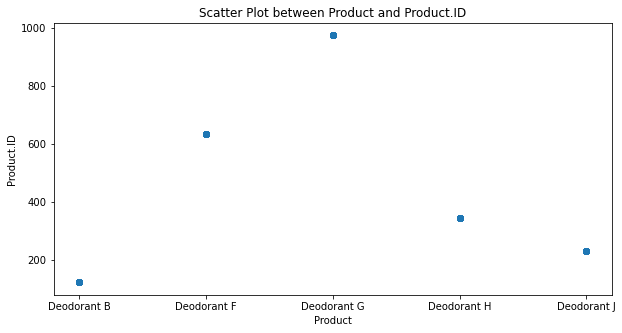

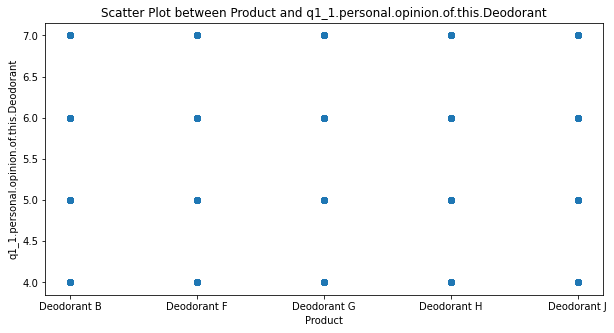

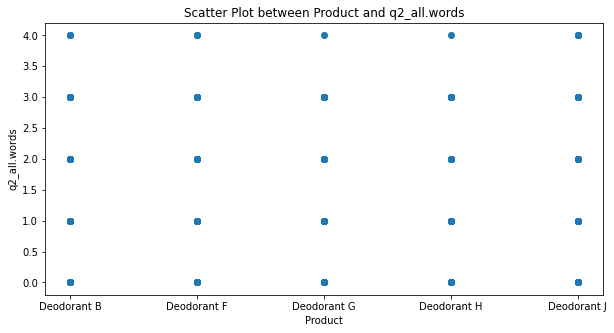

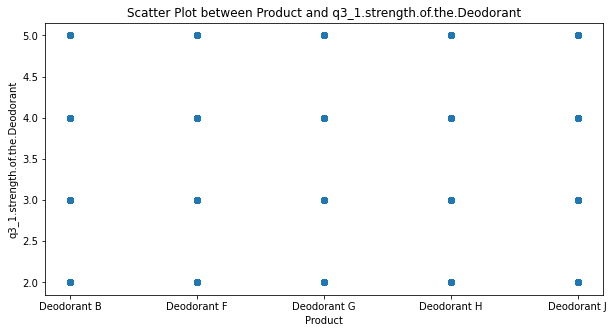

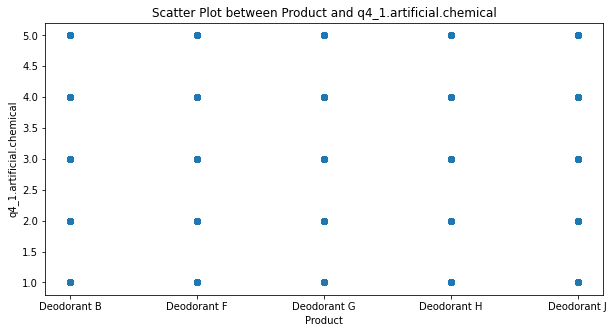

...

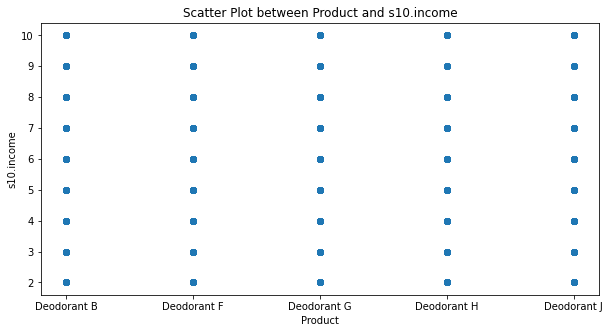

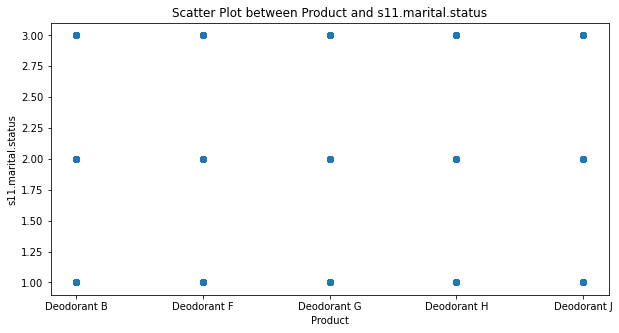

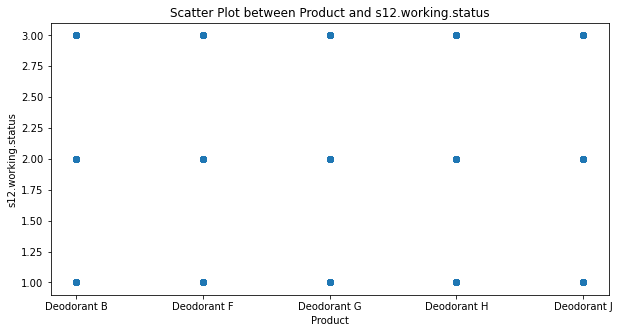

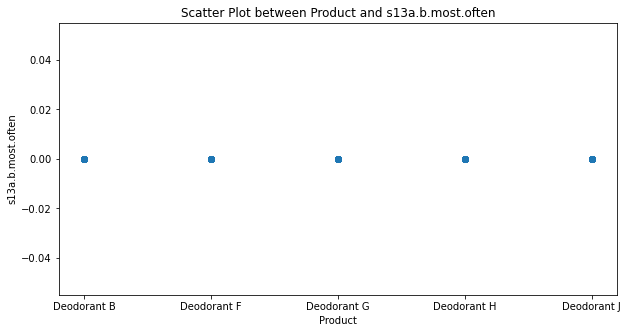

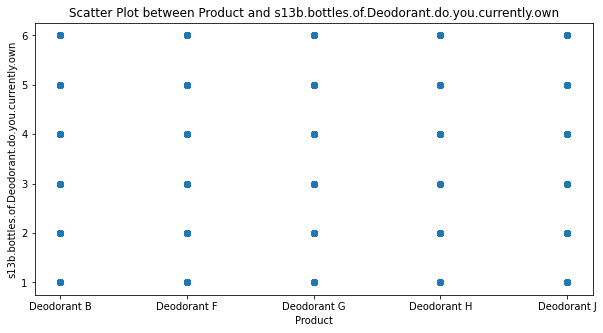

In [59]:
Unseen_D = pd.read_csv("test_data.csv")
Unseen_D_f = Unseen_D.copy()
## Irrelevant Columns 
Rem_cls = ['Respondent.ID','q7','s13.2','q8.1','q8.5','q8.6','q8.11','q8.2','q8.8','q8.12','q8.13','q8.19',
           'q8.20','s7.involved.in.the.selection.of.the.cosmetic.products']
Unseen_D_f = Unseen_D_f.drop(Rem_cls, axis = 1)
Attributesf = Unseen_D_f.keys()

for i, col in enumerate(Attributesf):
    if col != 'Product':
        fig, ax = plt.subplots(figsize=(10,5))
        ax.scatter(Final_Data['Product'],Final_Data[col]) 
        ax.set_xlabel('Product')
        ax.set_ylabel(col)
        ax.set_title(f'Scatter Plot between Product and {col}')

### Note:
+ Clustering is not a good way of working with this data-set because all the attributes are nominal/categorical/ordinal so if we try to visualize the clusters in plots, we will only get discrete points.
+ Although we can get the count of data objects at each point in the plot and can further claim that those points with large number of data objects are clusters and rest are outliers, but is it a smart way of doing this? Even a decision tree can build a rule for classifying this way... So why do we waste our time here?
+ So we won't apply clustering for replacing the outliers

### Method 3 : Inference - based
+ Replace the outliers with NAN values
+ Create Logistic Regression model to replace those NAN values by the trending value predicted by the model

#### Step I : Replacing the outliers by NAN values

In [60]:
def Fill_NAN(Data_f,var):
    Q1 = np.percentile(Data_f[f'{var}'], 25,interpolation = 'midpoint')
    Q2 = np.percentile(Data_f[f'{var}'], 50,interpolation = 'midpoint')
    Q3 = np.percentile(Data_f[f'{var}'], 75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    
    upper = Q3+1.5*IQR
    lower = Q1-1.5*IQR
    
    DS = Data_f[f'{var}']
    Ds = []
    for i in range(len(Data_f)):
        DS1 = DS[i]
        if (DS1>upper) & (DS1<lower):
            Ds.append(np.nan)
        else:
            Ds.append(DS1)
    Data_f[f'{var}'] = np.array(Ds)
    return Data_f

# Function to give updated data after replacing outlier by the NAN values in a single attribute
def Final_Data2(Data_f,var):
    ds = Data_f.copy()
    ds1  = Fill_NAN(ds,var)
    return ds1

In [61]:
Outliered_attributes = ['q1_1.personal.opinion.of.this.Deodorant','q3_1.strength.of.the.Deodorant','q4_10.feminine',
                      's8.ethnic.background','s11.marital.status','s12.working.status', 's13a.b.most.often']

Cleaned_Data2f3 = Data_f.copy()
for i in range(len(Outliered_attributes)):
    var = Outliered_attributes[i]
    Cleaned_Data2f2  = Final_Data2(Cleaned_Data2f3,var) 
    Cleaned_Data2f3 = Cleaned_Data2f2
    
Final_Data2f3 = Cleaned_Data2f3.dropna()
Final_Data2f3 = Cleaned_Data2f3.reset_index()
Final_Data2f3 = Final_Data2f3.drop(['index','Respondent.ID'],axis = 1)

#### Label Encoding

In [62]:
product = Final_Data2f3['Product'] 
prod_ID = Final_Data2f3['Product.ID'] 
le = LabelEncoder()
Final_Data2f3['Product']    = le.fit_transform(product)
Final_Data2f3['Product.ID'] = le.fit_transform(prod_ID)

#### Creating ML Model

In [63]:
def ML_Method(Data_df,Target_var):
    
    # Identifying features and the target variable
    Df3 = Data_df.copy()
    Target = Df3[f'{Target_var}']
    Features = Final_Data2f3.drop([f'{Target_var}'], axis=1)
    X_train, X_test, y_train, y_test = train_test_split(Features, Target, test_size = 0.20, random_state = 1)
    
    # Importing library for Logistic regression
    regressor = LogisticRegression(random_state = 0)
    
    # Fitting the data in Logistic regression
    regressor.fit(X_train, y_train)
    
    # Predicting test sets results 
    y_pred = regressor.predict(X_test)
    
    # Finding Model Accuracy
    plt.figure(figsize=(7,3),dpi=100)
    sns.heatmap(confusion_matrix(y_test, y_pred),cmap='coolwarm',fmt=".1f",annot=True)
    plt.title(f'''Target_var: {Target_var}
    Accuracy : {accuracy_score(y_test,y_pred)} Confusion Matrix''')

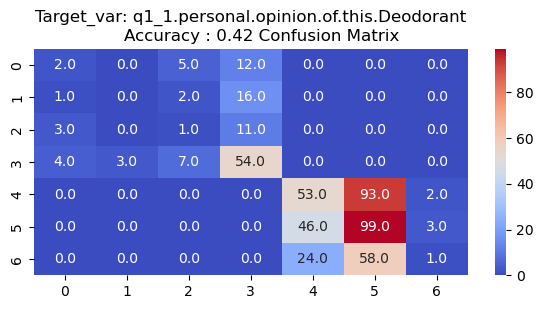

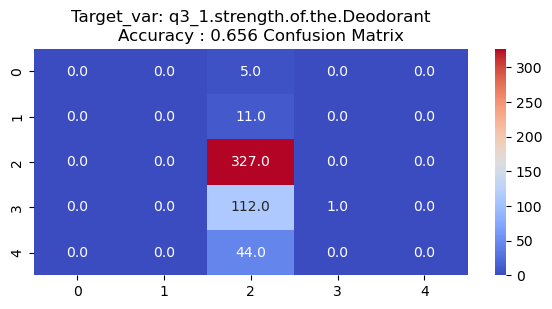

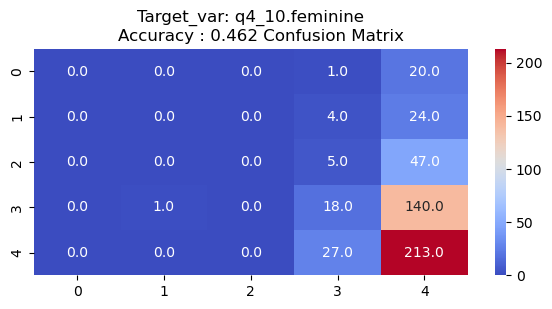

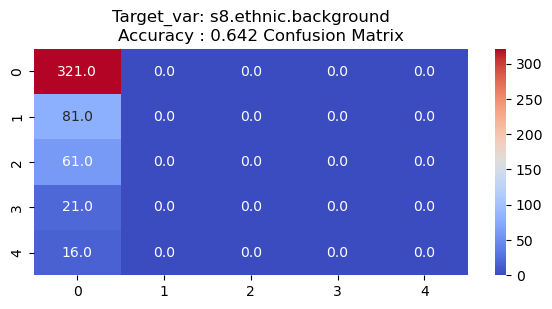

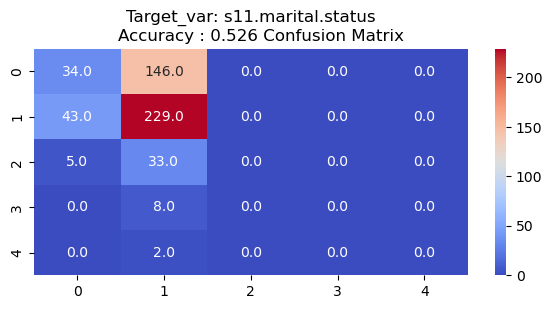

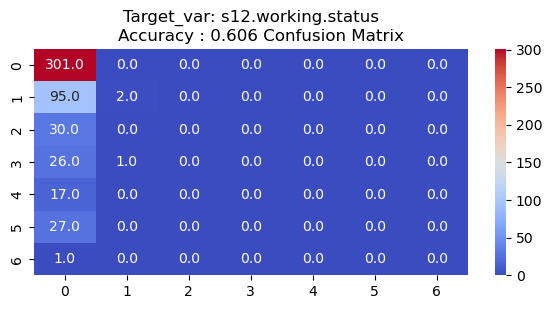

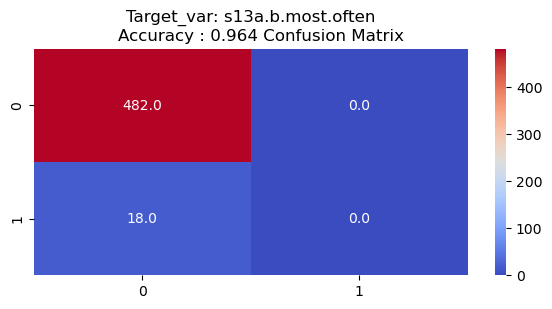

In [64]:
for i in range(len(Outliered_attributes)):
    Target_var = Outliered_attributes[i]
    Cleaned_Data2f4 = Cleaned_Data2f3.copy()
    ML_Method(Cleaned_Data2f4,Target_var)

+ We tried implementing Logistic regression to learn the model from data(without outliers), but we found that the accuracy of the models learnt such was very poor was 6 of the 7 attributes. 
+ For the last attribute, although the accuracy appeared good enough, but it is due to the fact that the data is highly class imbalanced and the prediction for attribute value 1 is very very poor.
+ Therefore this inference based logistic regression method of replacing outliers is not appropriate

<a id="1"></a>
### <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">3. Data Reduction</p>

## Method 1 : By correlation
+ Remove the most correlated data attributes

### Correlation by Chi-Square Test on the two categorical attributes

#### Step I : Contingency table

contingency_table :-



Text(0.5, 1.0, 'Contingency_table')

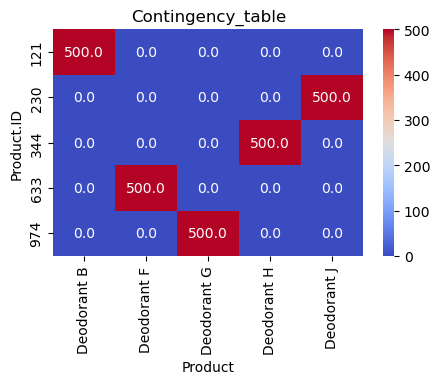

In [65]:
contingency_table = pd.crosstab(Data_f['Product.ID'],Data_f['Product'])
print('contingency_table :-\n')
plt.figure(figsize=(5,3),dpi=100)
sns.heatmap(contingency_table,cmap='coolwarm',fmt=".1f",annot=True)
plt.title('Contingency_table')

Chi - squared tests are based on the so-called chi-squared statistic. We calculate the chi-squared statistic with the following formula: 

$$ sum(\frac{(observed-expected)^2}{expected}) $$

In the formula, observed is the actual observed count for each category and expected is the expected count based on the distribution of the samples for the corresponding category. Let's calculate the chi-squared statistic for our data to illustrate:

#### Step II : Observed and Expected frequencies

Text(0.5, 1.0, 'Observed frequency')

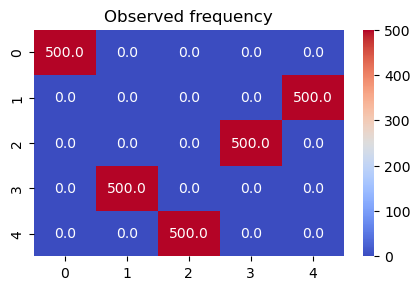

In [66]:
Observed_Values = contingency_table.values 
plt.figure(figsize=(5,3),dpi=100)
sns.heatmap(Observed_Values,cmap='coolwarm',fmt=".1f",annot=True)
plt.title('Observed frequency')

Text(0.5, 1.0, 'Expected frequency')

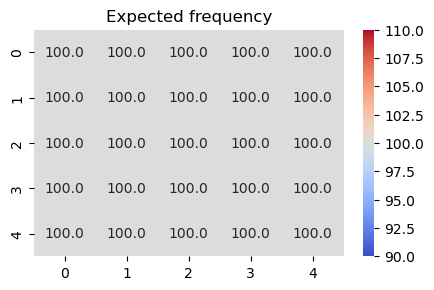

In [67]:
b = scipy.stats.chi2_contingency(contingency_table)
Expected_Values = b[3]
plt.figure(figsize=(5,3),dpi=100)
sns.heatmap(Expected_Values,cmap='coolwarm',fmt=".1f",annot=True)
plt.title('Expected frequency')

#### Step III : Degree of Freedom

In [68]:
N_rows,N_columns = contingency_table.shape
Dof = (N_rows-1)*(N_columns-1)
print("Degree of Freedom:-",Dof)

Degree of Freedom:- 16


#### Step IV : Significance Level 5 %

In [69]:
alpha = 0.05

#### Step V : Chi-square statistic - χ2

In [70]:
chi_square = sum([(o-e)**2./e for o,e in zip(Observed_Values,Expected_Values)])
chi_square_statistic = chi_square[0] + chi_square[1]
print("chi-square statistic:-",chi_square_statistic)

chi-square statistic:- 4000.0


#### Step VI : Critical_value

In [71]:
critical_value = chi2.ppf(q = 1-alpha,df = Dof)
print('critical_value:',critical_value)

critical_value: 26.29622760486423


#### Step VII : Compare chi_square_statistic with critical_value

In [72]:
if chi_square_statistic >= critical_value:
    print("Reject hypothesis, variables are dependent")
else:
    print("Retain hypothesis, variables are independent")

Reject hypothesis, variables are dependent


### Creating general function for the Chi - Square Test for the two variables

In [73]:
def Chi_Square_Test(var1,var2):
    dataset = Data
    contingency_table = pd.crosstab(dataset[f'{var1}'],dataset[f'{var2}'])
    Observed_Values = contingency_table.values 
    
    b = scipy.stats.chi2_contingency(contingency_table)
    Expected_Values = b[3]
    
    N_rows,N_columns = contingency_table.shape
    Dof = (N_rows-1)*(N_columns-1)
    
    alpha = 0.05
    
    chi_square = sum([(o-e)**2./e for o,e in zip(Observed_Values,Expected_Values)])
    chi_square_statistic = chi_square[0] + chi_square[1]
    
    critical_value = chi2.ppf(q = 1-alpha,df = Dof)
    P_value = 1 - chi2.cdf(x = chi_square_statistic,df = Dof)
    
    print(colored(f"Chi - Square test between {var1} and {var2} :"))
    print('Significance level: ',alpha)
    print('Degree of Freedom: ',Dof)
    print('chi-square statistic:',chi_square_statistic)
    print('critical_value:',critical_value)

    if chi_square_statistic >= critical_value:
        print(colored("Reject hypothesis, variables are dependent"))
    else:
        print(colored(f"Retain hypothesis, variables are independent"))
    print('\n')
    
 
Unseen_D = pd.read_csv("test_data.csv")
Unseen_D_f = Unseen_D.copy()
## Irrelevant Columns 
Rem_cls = ['Respondent.ID','q7','s13.2','q8.1','q8.5','q8.6','q8.11','q8.2','q8.8','q8.12','q8.13','q8.19',
           'q8.20','s7.involved.in.the.selection.of.the.cosmetic.products']
Unseen_D_f = Unseen_D_f.drop(Rem_cls, axis = 1)
Unseen_D_f.head()
Unseen_D_f.shape

Columns = Unseen_D_f.keys()
Columns = np.delete(Columns,38)
for i in range(len(Columns)):
    for j in range(len(Columns)):
        if i!=j:
            Chi_Square_Test(Columns[i],Columns[j])

Chi - Square test between Product.ID and Product :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4000.0
critical_value: 26.29622760486423
Reject hypothesis, variables are dependent


Chi - Square test between Product.ID and q1_1.personal.opinion.of.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 5.157509157509157
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between Product.ID and q2_all.words :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 3.0882753713471716
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between Product.ID and q3_1.strength.of.the.Deodorant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.541666666666667
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between Product.ID and q4_1.artificial.chemical :

Chi - Square test between Product and q4_20.overpowering :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.339190297984751
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between Product and q4_21.sharp :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.8814259485924114
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between Product and q4_22.sophisticated :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 10.248917748917748
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between Product and q4_23.upscale :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 8.830632883862549
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between Product and q4_24.well.rounded :
Significance level:  0.05
Degree o

Chi - Square test between q1_1.personal.opinion.of.this.Deodorant and q4_13.high.quality :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.7878539807494445
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q1_1.personal.opinion.of.this.Deodorant and q4_14.long.lasting :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.400177804442434
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q1_1.personal.opinion.of.this.Deodorant and q4_15.masculine :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 5.981947463769012
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q1_1.personal.opinion.of.this.Deodorant and q4_16.memorable :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 19.263563598138383
critical_value: 36.41502850180731
Retain 

Chi - Square test between q2_all.words and q4_5.casual :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 9.995531436965788
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q2_all.words and q4_6.cheap :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 4.473205821540645
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q2_all.words and q4_7.clean :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 5.495627454883128
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q2_all.words and q4_8.easy.to.wear :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 3.859135215789961
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q2_all.words and q4_9.elegant :
Significance level:  0.05


Chi - Square test between q3_1.strength.of.the.Deodorant and q12.which.occasions.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 11.459681656331774
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q3_1.strength.of.the.Deodorant and Q13_Liking.after.30.minutes :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 9.84757921235779
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q3_1.strength.of.the.Deodorant and q14.Deodorant.overall.on.a.scale.from.1.to.10 :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 4.037038424464851
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between q3_1.strength.of.the.Deodorant and ValSegb :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.243579569936898
critical_val

Chi - Square test between q4_1.artificial.chemical and q4_19.ordinary :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.718149106304798
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_1.artificial.chemical and q4_20.overpowering :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.964725017753292
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_1.artificial.chemical and q4_21.sharp :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.293873053409326
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_1.artificial.chemical and q4_22.sophisticated :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 9.451644654533736
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between 

Chi - Square test between q4_2.attractive and s13a.b.most.often :
Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 2.1777564385082866
critical_value: 9.487729036781154
Retain hypothesis, variables are independent


Chi - Square test between q4_2.attractive and s13b.bottles.of.Deodorant.do.you.currently.own :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 5.534113721782849
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q4_3.bold and Product.ID :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.8487660797105168
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_3.bold and Product :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.333787027796589
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_3.bold and q1_1.personal.

Chi - Square test between q4_3.bold and q12.which.occasions.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 2.3140080365247435
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q4_3.bold and Q13_Liking.after.30.minutes :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 4.939479512838796
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q4_3.bold and q14.Deodorant.overall.on.a.scale.from.1.to.10 :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 5.94982999756567
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between q4_3.bold and ValSegb :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 10.265434061567941
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square t

Chi - Square test between q4_5.casual and q4_3.bold :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 1.0452652745343132
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_5.casual and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.101031185051392
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_5.casual and q4_6.cheap :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 8.445538012441578
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_5.casual and q4_7.clean :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.454911330440336
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_5.casual and q4_8.easy.to.wear :
Significance level:  0.05
Degree of F

Chi - Square test between q4_6.cheap and q4_11.for.someone.like.me :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 10.64552228408569
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_6.cheap and q4_12.heavy :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 9.525991090304712
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_6.cheap and q4_13.high.quality :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.67880929677512
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_6.cheap and q4_14.long.lasting :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 1.6008984871900998
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_6.cheap and q4_15.masculine :
Significance 

Chi - Square test between q4_7.clean and q4_2.attractive :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.790819820298192
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_7.clean and q4_3.bold :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.419052676963561
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_7.clean and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.219905631609233
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_7.clean and q4_5.casual :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 9.852633473987986
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_7.clean and q4_6.cheap :
Significance level:  0.05
Degree of Freedom:

Chi - Square test between q4_8.easy.to.wear and q4_11.for.someone.like.me :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.133605435647479
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_8.easy.to.wear and q4_12.heavy :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 13.318440602366397
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_8.easy.to.wear and q4_13.high.quality :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.849838680854945
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_8.easy.to.wear and q4_14.long.lasting :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.489949284071306
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_8.easy.to.wea

Chi - Square test between q4_9.elegant and q4_1.artificial.chemical :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.6920101176942275
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_9.elegant and q4_2.attractive :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.327586889220912
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_9.elegant and q4_3.bold :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 12.441761686968144
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_9.elegant and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.2316839392341175
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_9.elegant and q4_5.casual :
Significance leve

Chi - Square test between q4_9.elegant and s13a.b.most.often :
Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 6.81047060224992
critical_value: 9.487729036781154
Retain hypothesis, variables are independent


Chi - Square test between q4_9.elegant and s13b.bottles.of.Deodorant.do.you.currently.own :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 6.337959579835291
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q4_10.feminine and Product.ID :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.773135680168517
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_10.feminine and Product :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.082858430191237
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_10.feminine and q1_1.per

Chi - Square test between q4_11.for.someone.like.me and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.917160692953216
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_11.for.someone.like.me and q4_5.casual :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.114949296171835
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_11.for.someone.like.me and q4_6.cheap :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.7507344103048155
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_11.for.someone.like.me and q4_7.clean :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.453721895166707
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_11.for.some

Chi - Square test between q4_12.heavy and q10.prefer.this.Deodorant.or.your.usual.Deodorant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 12.617400828926595
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_12.heavy and q11.time.of.day.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 2.9983897201197203
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q4_12.heavy and q12.which.occasions.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 6.089495399252087
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q4_12.heavy and Q13_Liking.after.30.minutes :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 6.379144511560805
critical_value: 36.41502850180731
Retai

Chi - Square test between q4_13.high.quality and q12.which.occasions.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 4.076395325390644
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q4_13.high.quality and Q13_Liking.after.30.minutes :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.910842390556766
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q4_13.high.quality and q14.Deodorant.overall.on.a.scale.from.1.to.10 :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 6.303810946799954
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between q4_13.high.quality and ValSegb :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 4.912304881119352
critical_value: 36.41502850180731
Retain hypothesis, variabl

Chi - Square test between q4_14.long.lasting and q4_21.sharp :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.8135435961655544
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_14.long.lasting and q4_22.sophisticated :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 1.5770683474484684
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_14.long.lasting and q4_23.upscale :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.7508242039472854
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_14.long.lasting and q4_24.well.rounded :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 15.122626309761767
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_14.long.lasting an

Chi - Square test between q4_15.masculine and q4_14.long.lasting :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 10.540715372401841
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_15.masculine and q4_16.memorable :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.157305212970165
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_15.masculine and q4_17.natural :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.976662302327669
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_15.masculine and q4_18.old.fashioned :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.6975061287827895
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_15.masculine and q4_19.ordin

Chi - Square test between q4_16.memorable and q4_8.easy.to.wear :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.199052837388805
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_16.memorable and q4_9.elegant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.696686655819106
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_16.memorable and q4_10.feminine :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 8.055779275107142
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_16.memorable and q4_11.for.someone.like.me :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.720009534175862
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_16.memorable and q4_12.heav

Chi - Square test between q4_17.natural and q4_2.attractive :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.875240849008391
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_17.natural and q4_3.bold :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 9.54607674741056
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_17.natural and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.006894744502192
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_17.natural and q4_5.casual :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.7639941439724076
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_17.natural and q4_6.cheap :
Significance level:  0.05
Deg

Chi - Square test between q4_17.natural and s13b.bottles.of.Deodorant.do.you.currently.own :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 6.578240288707374
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and Product.ID :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 8.076278522263385
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and Product :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.848838519108497
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and q1_1.personal.opinion.of.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.5313974403150565
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Squa

Chi - Square test between q4_18.old.fashioned and ValSegb :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 10.0459722162961
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and s8.ethnic.background :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.9822290920910826
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and s10.income :
Significance level:  0.05
Degree of Freedom:  32
chi-square statistic: 2.625204666812635
critical_value: 46.19425952027847
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and s11.marital.status :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.802928492160844
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_18.old.fashioned and s12

Chi - Square test between q4_19.ordinary and q9.how.likely.would.you.be.to.purchase.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.038344428152692
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_19.ordinary and q10.prefer.this.Deodorant.or.your.usual.Deodorant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.13430157324235
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_19.ordinary and q11.time.of.day.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 4.355795506051281
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q4_19.ordinary and q12.which.occasions.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 6.515844894979983
cri

Chi - Square test between q4_20.overpowering and q4_19.ordinary :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.2873498830242505
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_20.overpowering and q4_21.sharp :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.209914941291872
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_20.overpowering and q4_22.sophisticated :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.0619187578763016
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_20.overpowering and q4_23.upscale :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.9503412635357216
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_20.overpowering and q4_

Chi - Square test between q4_21.sharp and q4_13.high.quality :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 9.711970425076835
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_21.sharp and q4_14.long.lasting :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 8.67760398398234
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_21.sharp and q4_15.masculine :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.6460423445196217
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_21.sharp and q4_16.memorable :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.873524053937123
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_21.sharp and q4_17.natural :
Significance le

Chi - Square test between q4_22.sophisticated and q4_7.clean :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 2.1097331668599852
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_22.sophisticated and q4_8.easy.to.wear :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.758674469865062
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_22.sophisticated and q4_9.elegant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 8.443898720539977
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_22.sophisticated and q4_10.feminine :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.951306569764601
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_22.sophisticated and q4_1

Chi - Square test between q4_23.upscale and q4_1.artificial.chemical :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.983933603012715
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_23.upscale and q4_2.attractive :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.7494905815782955
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_23.upscale and q4_3.bold :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.4733439918301263
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_23.upscale and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.297847888325263
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_23.upscale and q4_5.casual :
Significance 

Chi - Square test between q4_23.upscale and s13b.bottles.of.Deodorant.do.you.currently.own :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 11.000334742515948
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and Product.ID :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.796583036222704
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and Product :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.94489003664553
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and q1_1.personal.opinion.of.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 6.603859165859777
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square t

Chi - Square test between q4_24.well.rounded and ValSegb :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.864426205904943
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and s8.ethnic.background :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.557552889622579
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and s10.income :
Significance level:  0.05
Degree of Freedom:  32
chi-square statistic: 10.728222892052038
critical_value: 46.19425952027847
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and s11.marital.status :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 14.489882089553376
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q4_24.well.rounded and s12.wo

Chi - Square test between q5_1.Deodorant.is.addictive and q9.how.likely.would.you.be.to.purchase.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.705366204999965
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q5_1.Deodorant.is.addictive and q10.prefer.this.Deodorant.or.your.usual.Deodorant :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.1185491606667
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q5_1.Deodorant.is.addictive and q11.time.of.day.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 9.414418257588919
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q5_1.Deodorant.is.addictive and q12.which.occasions.would.this.Deodorant.be.appropriate :
Significance level:  0.05
Degree of Free

Chi - Square test between q9.how.likely.would.you.be.to.purchase.this.Deodorant and q4_20.overpowering :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.119351429887382
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q9.how.likely.would.you.be.to.purchase.this.Deodorant and q4_21.sharp :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.764358397376766
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q9.how.likely.would.you.be.to.purchase.this.Deodorant and q4_22.sophisticated :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.6766331099107674
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q9.how.likely.would.you.be.to.purchase.this.Deodorant and q4_23.upscale :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 1.4703127

Chi - Square test between q10.prefer.this.Deodorant.or.your.usual.Deodorant and q4_14.long.lasting :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 6.393599631500968
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q10.prefer.this.Deodorant.or.your.usual.Deodorant and q4_15.masculine :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.184237045105212
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q10.prefer.this.Deodorant.or.your.usual.Deodorant and q4_16.memorable :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.052375274746101
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between q10.prefer.this.Deodorant.or.your.usual.Deodorant and q4_17.natural :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 11.528335236620158
critic

Chi - Square test between q11.time.of.day.would.this.Deodorant.be.appropriate and q4_9.elegant :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 6.4027316257198885
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q11.time.of.day.would.this.Deodorant.be.appropriate and q4_10.feminine :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 1.2073071297382834
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q11.time.of.day.would.this.Deodorant.be.appropriate and q4_11.for.someone.like.me :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 2.352694127202874
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q11.time.of.day.would.this.Deodorant.be.appropriate and q4_12.heavy :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 0.402735477562825
c

Chi - Square test between q12.which.occasions.would.this.Deodorant.be.appropriate and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 0.8834748949511795
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q12.which.occasions.would.this.Deodorant.be.appropriate and q4_5.casual :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 1.7150627018617084
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q12.which.occasions.would.this.Deodorant.be.appropriate and q4_6.cheap :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 0.6174636732293227
critical_value: 15.50731305586545
Retain hypothesis, variables are independent


Chi - Square test between q12.which.occasions.would.this.Deodorant.be.appropriate and q4_7.clean :
Significance level:  0.05
Degree of Freedom:  8
chi-square statistic: 3.9367993311250187
cri

Chi - Square test between Q13_Liking.after.30.minutes and q2_all.words :
Significance level:  0.05
Degree of Freedom:  30
chi-square statistic: 9.272787747356176
critical_value: 43.77297182574219
Retain hypothesis, variables are independent


Chi - Square test between Q13_Liking.after.30.minutes and q3_1.strength.of.the.Deodorant :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 13.96278999556316
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between Q13_Liking.after.30.minutes and q4_1.artificial.chemical :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 3.4078960174971566
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between Q13_Liking.after.30.minutes and q4_2.attractive :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 11.421122736516942
critical_value: 36.41502850180731
Retain hypothesis, variables are indepen

Chi - Square test between Q13_Liking.after.30.minutes and s11.marital.status :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 8.040615305734903
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between Q13_Liking.after.30.minutes and s12.working.status :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 6.416655283396669
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between Q13_Liking.after.30.minutes and s13a.b.most.often :
Significance level:  0.05
Degree of Freedom:  6
chi-square statistic: 8.977988781135007
critical_value: 12.591587243743977
Retain hypothesis, variables are independent


Chi - Square test between Q13_Liking.after.30.minutes and s13b.bottles.of.Deodorant.do.you.currently.own :
Significance level:  0.05
Degree of Freedom:  30
chi-square statistic: 7.86208820368608
critical_value: 43.77297182574219
Retain hypothesis, variab

Chi - Square test between q14.Deodorant.overall.on.a.scale.from.1.to.10 and q5_1.Deodorant.is.addictive :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 15.867926565120309
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between q14.Deodorant.overall.on.a.scale.from.1.to.10 and q9.how.likely.would.you.be.to.purchase.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 14.095718512516655
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between q14.Deodorant.overall.on.a.scale.from.1.to.10 and q10.prefer.this.Deodorant.or.your.usual.Deodorant :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 7.620690018216681
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between q14.Deodorant.overall.on.a.scale.from.1.to.10 and q11.time.of.day.would.this.Deodorant.be.approp

Chi - Square test between ValSegb and q4_17.natural :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 7.5948407781242455
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between ValSegb and q4_18.old.fashioned :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 10.946844966411406
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between ValSegb and q4_19.ordinary :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 15.161505304605786
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between ValSegb and q4_20.overpowering :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 8.700079674152557
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between ValSegb and q4_21.sharp :
Significance level:  0.05
Degree of F

Chi - Square test between s8.ethnic.background and q4_10.feminine :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.068055986046556
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between s8.ethnic.background and q4_11.for.someone.like.me :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 13.081395450737098
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between s8.ethnic.background and q4_12.heavy :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 3.4203590026457444
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between s8.ethnic.background and q4_13.high.quality :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 5.923474337196954
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between s8.ethni

Chi - Square test between s10.income and q4_3.bold :
Significance level:  0.05
Degree of Freedom:  32
chi-square statistic: 18.87544286904729
critical_value: 46.19425952027847
Retain hypothesis, variables are independent


Chi - Square test between s10.income and q4_4.boring :
Significance level:  0.05
Degree of Freedom:  32
chi-square statistic: 7.000525614270652
critical_value: 46.19425952027847
Retain hypothesis, variables are independent


Chi - Square test between s10.income and q4_5.casual :
Significance level:  0.05
Degree of Freedom:  32
chi-square statistic: 9.969220808853049
critical_value: 46.19425952027847
Retain hypothesis, variables are independent


Chi - Square test between s10.income and q4_6.cheap :
Significance level:  0.05
Degree of Freedom:  32
chi-square statistic: 9.287743035549564
critical_value: 46.19425952027847
Retain hypothesis, variables are independent


Chi - Square test between s10.income and q4_7.clean :
Significance level:  0.05
Degree of Freedom:  32


Chi - Square test between s10.income and s13b.bottles.of.Deodorant.do.you.currently.own :
Significance level:  0.05
Degree of Freedom:  40
chi-square statistic: 4.6999095213173
critical_value: 55.75847927888702
Retain hypothesis, variables are independent


Chi - Square test between s11.marital.status and Product.ID :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 4.261349416043986
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between s11.marital.status and Product :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 7.186821191628885
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square test between s11.marital.status and q1_1.personal.opinion.of.this.Deodorant :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 6.323400188063804
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test be

Chi - Square test between s11.marital.status and Q13_Liking.after.30.minutes :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 4.648106843044441
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between s11.marital.status and q14.Deodorant.overall.on.a.scale.from.1.to.10 :
Significance level:  0.05
Degree of Freedom:  36
chi-square statistic: 7.438943266957752
critical_value: 50.99846016571065
Retain hypothesis, variables are independent


Chi - Square test between s11.marital.status and ValSegb :
Significance level:  0.05
Degree of Freedom:  24
chi-square statistic: 6.15000473069444
critical_value: 36.41502850180731
Retain hypothesis, variables are independent


Chi - Square test between s11.marital.status and s8.ethnic.background :
Significance level:  0.05
Degree of Freedom:  16
chi-square statistic: 1.4380492032268095
critical_value: 26.29622760486423
Retain hypothesis, variables are independent


Chi - Square 

Chi - Square test between s13a.b.most.often and q4_15.masculine :
Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 0.78225354434081
critical_value: 9.487729036781154
Retain hypothesis, variables are independent


Chi - Square test between s13a.b.most.often and q4_16.memorable :
Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 3.041239786077592
critical_value: 9.487729036781154
Retain hypothesis, variables are independent


Chi - Square test between s13a.b.most.often and q4_17.natural :
Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 0.9907852063997709
critical_value: 9.487729036781154
Retain hypothesis, variables are independent


Chi - Square test between s13a.b.most.often and q4_18.old.fashioned :
Significance level:  0.05
Degree of Freedom:  4
chi-square statistic: 1.8834022785443527
critical_value: 9.487729036781154
Retain hypothesis, variables are independent


Chi - Square test between s13a.b.most.often and q4_19.ord

Chi - Square test between s13b.bottles.of.Deodorant.do.you.currently.own and q4_10.feminine :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 8.940422986964142
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between s13b.bottles.of.Deodorant.do.you.currently.own and q4_11.for.someone.like.me :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 10.092101091253774
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between s13b.bottles.of.Deodorant.do.you.currently.own and q4_12.heavy :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 12.779195111413316
critical_value: 31.410432844230918
Retain hypothesis, variables are independent


Chi - Square test between s13b.bottles.of.Deodorant.do.you.currently.own and q4_13.high.quality :
Significance level:  0.05
Degree of Freedom:  20
chi-square statistic: 10.445368667026113
critica

### Correlation using Pearson Coefficient

<AxesSubplot:>

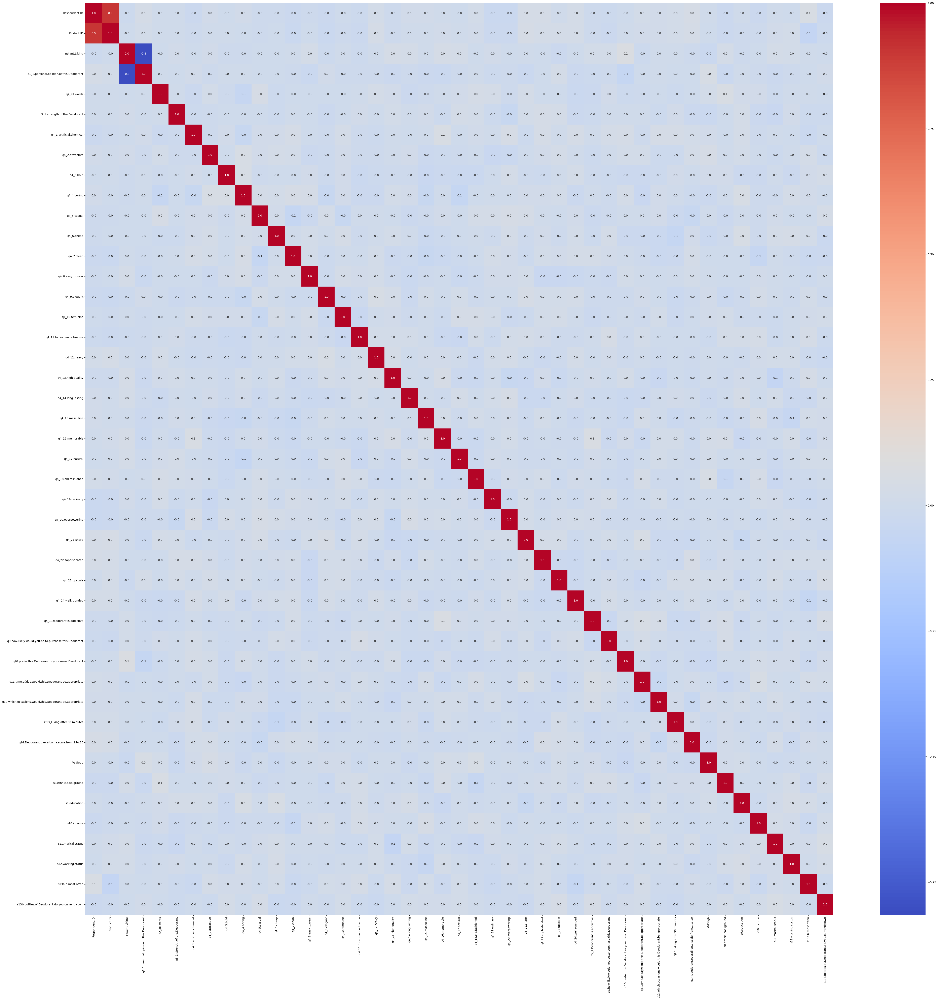

In [74]:
plt.figure(figsize=(60,60),dpi=100)
sns.heatmap(Data_f.corr(),cmap='coolwarm',fmt=".1f",annot=True)

### Identifying the redundant attributes in the dataset using Pearson correlation coefficient

In [75]:
Keys = Data_f.keys()
Keys = np.delete(Keys,2)
for i in range(len(Keys)):
    for j in range(len(Keys)):
        corr, _ = pearsonr(Data_f[Keys[i]], Data_f[Keys[j]])
        if i != j:
            if (corr)>0.7:
                print(f'Attributes {Keys[i]} and {Keys[j]} both are duplicated with the {corr}')

Attributes Respondent.ID and Product.ID both are duplicated with the 0.9040029986210325
Attributes Product.ID and Respondent.ID both are duplicated with the 0.9040029986210325


#### Note : Respondent ID and the ProductID columns are more than 90 % correlated

+ Respondent ID and Product ID both are almost same so we can remove it as redundant column
+ All other attributes are having no correlation so all are relevant attributes so we can't remove those

In [76]:
MissingData_colums = ['Respondent.ID']
Data_f = Data_f.drop(MissingData_colums, axis = 1)

In [77]:
Data_f.shape

(2500, 45)

### Method 2 : Dimensionality or attribute reduction by PCA

Why we need to perform the dimensionality reduction on the selected features before putting them through the ML algorithm.  
+ In this Classification problem, there are many attributes on the basis of which the final classification will be done. 
+ The more will be the number of features, the algorithm  will take more time to run with it. 
+ Many of these features are correlated, and hence redundant. 

Dimensionality reduction is the process of reducing the number of random attributes under consideration, by obtaining a set of principal variables.
+ Principal component analysis (PCA) is a technique for reducing the dimensionality of such datasets, increasing interpretability but at the same time minimizing information loss.
+ Here, I will be reducing the dimensions to 3.

#### Sufficient requirement for PCA :
+ Minimum number of attributes should be 2
+ Data type should be numeric since we require feature scaling before applying PCA on the raw data

In [78]:
# Step I : Feature Scaling ( Transforming the data values of all the attributes on single scale )
df = Data_f.drop(['Instant.Liking','Product'],axis = 1)
scaler = StandardScaler()
scaler.fit(df)
scaled_ds = pd.DataFrame(scaler.transform(df),columns= df.columns )
scaled_ds

,Product.ID,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,q4_5.casual,q4_6.cheap,...,Q13_Liking.after.30.minutes,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own
0,-1.100694,-0.762408,-0.129783,0.882257,-0.361183,1.006254,0.359832,-0.194433,-0.381624,2.021746,...,-2.238682,0.101087,1.770809,-0.641663,0.825471,-0.841963,-1.020916,-0.623552,-0.199834,-0.044451
1,-1.100694,-0.087472,-0.129783,0.882257,1.083548,-1.346273,-1.225332,-0.999203,-0.381624,-0.264952,...,-1.107920,0.500325,1.261605,-0.641663,0.825471,-0.841963,-1.020916,-0.623552,-0.199834,0.572925
2,-1.100694,0.587464,-0.129783,-0.463468,-0.361183,1.006254,-1.225332,1.415109,-1.164923,1.259513,...,-1.673301,-0.697388,1.770809,-0.641663,-0.205337,0.001687,-1.020916,-0.623552,-0.199834,-0.661827
3,-1.100694,-0.762408,-1.200597,0.882257,1.805913,1.006254,0.359832,0.610338,1.184976,-0.264952,...,0.588222,0.500325,-1.284417,-0.641663,0.825471,1.688988,-1.020916,0.765205,-0.199834,-0.044451
4,-1.100694,-0.762408,-0.129783,-1.809192,-1.083548,-0.562097,-2.017914,-0.999203,-0.381624,0.497281,...,0.022841,-1.096626,0.243196,-0.641663,-0.205337,0.001687,-1.020916,0.070827,-0.199834,-0.044451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.747201,0.587464,-0.129783,-0.463468,1.083548,1.006254,0.359832,2.219880,-0.381624,0.497281,...,1.153603,1.298800,1.261605,2.252186,-0.205337,-0.420138,0.354981,2.848339,-0.199834,-0.044451
2496,-0.747201,-0.087472,-1.200597,-0.463468,-1.083548,0.222079,-2.017914,2.219880,-1.164923,-1.027185,...,1.153603,-0.298151,-0.266008,-0.641663,-1.236145,1.688988,0.354981,-0.623552,-0.199834,-0.661827
2497,-0.747201,-0.762408,0.941032,-0.463468,0.361183,1.006254,0.359832,-0.999203,-0.381624,-1.027185,...,0.588222,-1.495864,1.770809,3.216802,0.825471,0.423512,-1.020916,-0.623552,-0.199834,1.190301
2498,-0.747201,-0.087472,0.941032,0.882257,-0.361183,-0.562097,0.359832,-0.999203,-1.164923,2.021746,...,-2.238682,0.101087,-0.775213,-0.641663,-0.205337,0.001687,1.730879,0.070827,-0.199834,0.572925


In [79]:
# Step II : Initiating PCA to reduce dimentions features to 3
pca = PCA(n_components = 3)
pca.fit(scaled_ds)
PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["PC1","PC2","PC3"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,2500.0,-2.176037e-17,1.128416,-3.619724,-0.749095,-0.010544,0.789241,4.148111
PC2,2500.0,-6.353147e-17,1.105804,-3.612280,-0.749591,-0.026686,0.728161,4.828120
PC3,2500.0,5.264400e-17,1.080865,-3.407709,-0.730701,-0.002395,0.725446,3.570028


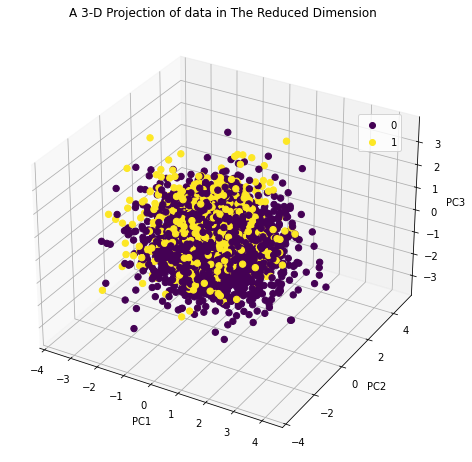

In [80]:
# Step III : A 3-D projection of dataset in the reduced dimension
x = PCA_ds["PC1"]
y = PCA_ds["PC2"]
z = PCA_ds["PC3"]

fig = plt.figure(figsize = (6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
cmap = 'viridis'
sc = ax.scatter(x, y, z, s=40, c=Data['Instant.Liking'], marker='o', cmap=cmap, alpha=1)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'''A 3-D Projection of data in The Reduced Dimension''')
plt.legend(*sc.legend_elements(), bbox_to_anchor=(0.8,0.8), loc=2)

### PCA function on the attributes 

+ All the 42 attribute columns taken first
+ Then started reducing the attribute by one in every step
+ Applying PCA in every steps
+ Visualizing the variations in 3D of all the 3 PC's

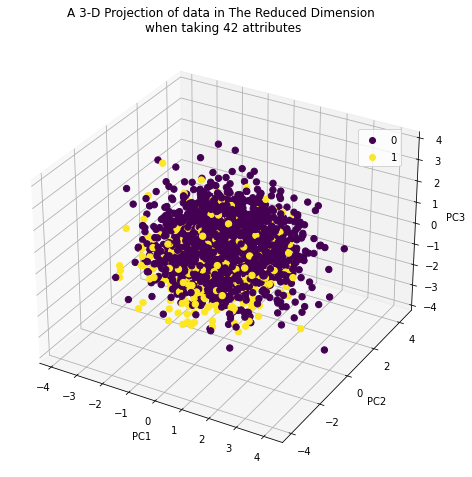

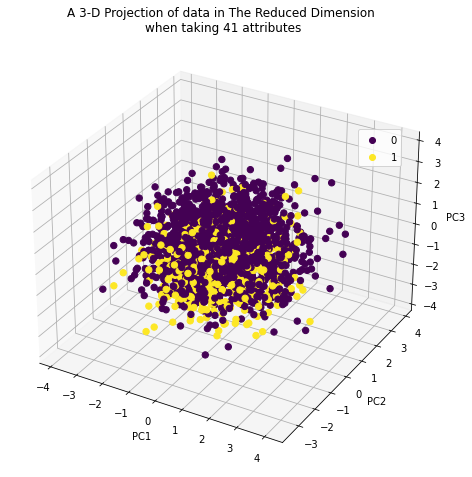

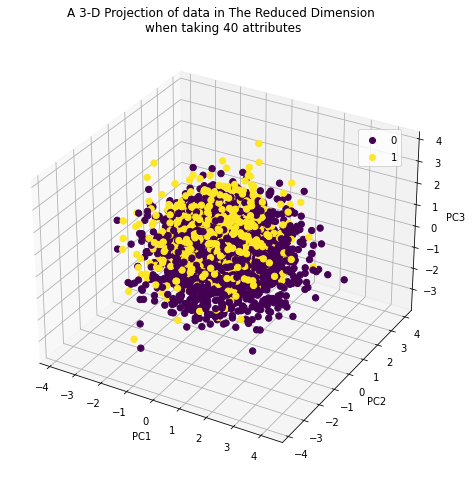

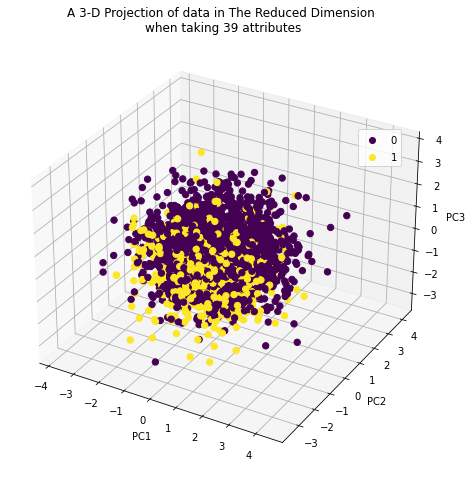

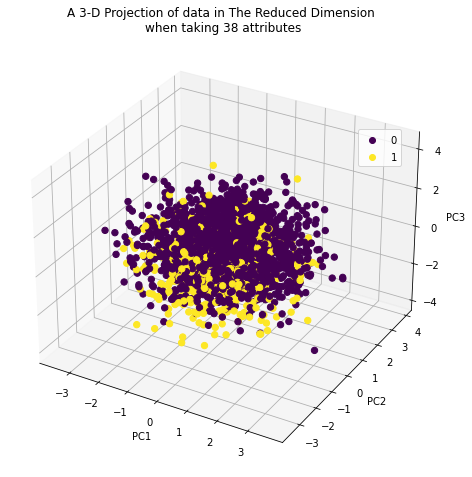

...

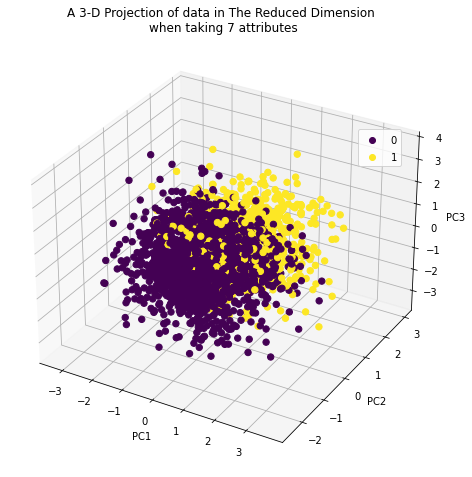

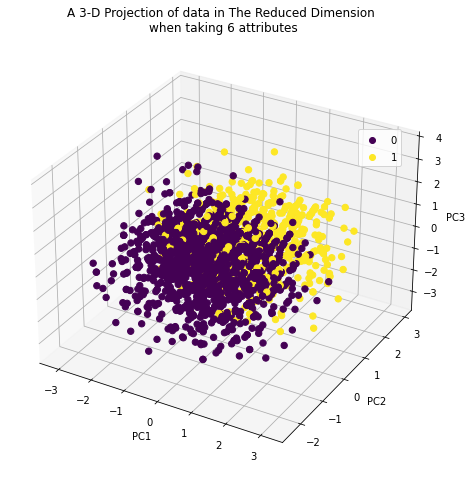

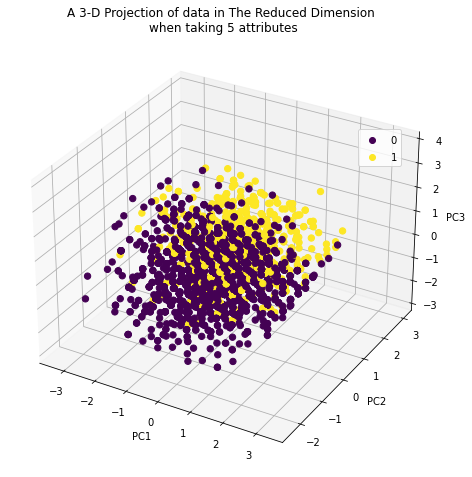

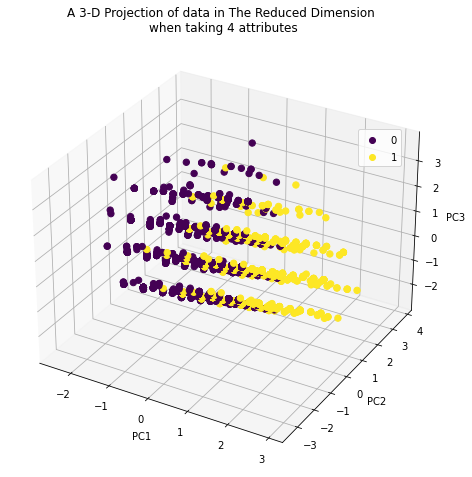

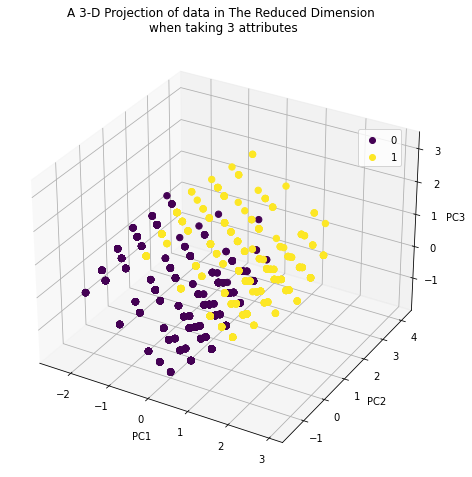

In [81]:
scaled_df = scaled_ds.copy()
for i in range(40):
    V_f = scaled_df.keys()
    n = len(V_f)
    scaled_df = scaled_df.drop([f'{V_f[n-1]}'],axis = 1)
    pca = PCA(n_components = 3)
    pca.fit(scaled_df)
    PCA_ds = pd.DataFrame(pca.transform(scaled_df), columns=(["PC1","PC2","PC3"]))
    PCA_ds.describe().T

    x = PCA_ds["PC1"]
    y = PCA_ds["PC2"]
    z = PCA_ds["PC3"]
    
    fig = plt.figure(figsize = (6,6))
    ax = Axes3D(fig, auto_add_to_figure=False)
    fig.add_axes(ax)
    cmap = 'viridis'
    sc = ax.scatter(x, y, z, s=40, c=Data['Instant.Liking'], marker='o', cmap=cmap, alpha=1)
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title(f'''A 3-D Projection of data in The Reduced Dimension 
when taking {n-1} attributes''')
    plt.legend(*sc.legend_elements(), bbox_to_anchor=(0.8,0.8), loc=2)

#### Here we can see that all the PCs are of equal variance 

Text(0, 0.5, 'Information retained')

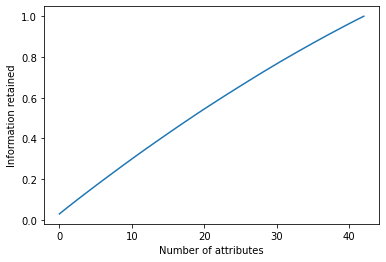

In [82]:
PCA_43 = PCA(n_components = 43,random_state = 2)
PCA_43.fit(scaled_ds)
PCA_43_ = PCA_43.transform(scaled_ds)

plt.plot(np.cumsum(PCA_43.explained_variance_ratio_))
plt.xlabel('Number of attributes')
plt.ylabel('Information retained')

### Note : 
+ PCA is not an appropriate method to retrieve the most varying and important attribute for this data 
+ As these are ordinal attributes and the PCA is applicable only on the numerical attributes

<a id="1"></a>
### <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">4. Data Transformation by normalization</p>

### **Benifits :**
   + All attributes converted into equal weight avoiding dependence of measurement unit's choice
   + Scaled to fall within a smaller specified range
   + Make mining process more efficient and patterns found easier to understand

### Min-max normalization of the data

In [83]:
def Min_Max_Normalization(attribute,df,New_min,New_max):
    min_ = np.min(df[f'{attribute}'])
    max_ = np.max(df[f'{attribute}'])
    Normalized = []
    for i in range(len(df[f'{attribute}'])):
        v = df[f'{attribute}']
        h = New_max - New_min
        min_maxN = ((v[i] - min_) / (max_ - min_))*h + New_min
        Normalized.append(min_maxN)
    return Normalized

### Normalized Data

In [84]:
attribute = np.delete(Keys,0)
attribute = np.delete(attribute,0)
attribute = np.delete(attribute,0)
New_min = 1
New_max = 10
dataset_N1 = Data_f.copy()
for i in range(len(attribute)):
    N = Min_Max_Normalization(attribute[i],Data_f,New_min,New_max)
    dataset_N1[attribute[i]] = N

In [85]:
dataset_N1

,Product.ID,Product,Instant.Liking,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,...,Q13_Liking.after.30.minutes,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own
0,121,Deodorant B,1,5.5,2.8,7.75,3.25,10.00,7.75,3.25,...,1.0,7.0,10.0,1.00,4.6,2.125,1.00,1.0,1.0,4.6
1,121,Deodorant B,0,7.0,2.8,7.75,7.75,3.25,3.25,1.00,...,4.0,8.0,8.5,1.00,4.6,2.125,1.00,1.0,1.0,6.4
2,121,Deodorant B,0,8.5,2.8,5.50,3.25,10.00,3.25,7.75,...,2.5,5.0,10.0,1.00,2.8,4.375,1.00,1.0,1.0,2.8
3,121,Deodorant B,1,5.5,1.0,7.75,10.00,10.00,7.75,5.50,...,8.5,8.0,1.0,1.00,4.6,8.875,1.00,4.0,1.0,4.6
4,121,Deodorant B,1,5.5,2.8,3.25,1.00,5.50,1.00,1.00,...,7.0,4.0,5.5,1.00,2.8,4.375,1.00,2.5,1.0,4.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,230,Deodorant J,0,8.5,2.8,5.50,7.75,10.00,7.75,10.00,...,10.0,10.0,8.5,7.75,2.8,3.250,3.25,8.5,1.0,4.6
2496,230,Deodorant J,0,7.0,1.0,5.50,1.00,7.75,1.00,10.00,...,10.0,6.0,4.0,1.00,1.0,8.875,3.25,1.0,1.0,2.8
2497,230,Deodorant J,1,5.5,4.6,5.50,5.50,10.00,7.75,1.00,...,8.5,3.0,10.0,10.00,4.6,5.500,1.00,1.0,1.0,8.2
2498,230,Deodorant J,0,7.0,4.6,7.75,3.25,5.50,7.75,1.00,...,1.0,7.0,2.5,1.00,2.8,4.375,5.50,2.5,1.0,6.4


### Note :
+ Normalization is not valid for ordinal attributes of the data
+ We will loss most of the information after doing this
+ So normalized data is not used in training the model

## Cleaned Data :

In [86]:
Data_f

,Product.ID,Product,Instant.Liking,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,...,Q13_Liking.after.30.minutes,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own
0,121,Deodorant B,1,4,1,4,2,5,4,2,...,1,7,7,1,4,3,1,1,0,3
1,121,Deodorant B,0,5,1,4,4,2,2,1,...,3,8,6,1,4,3,1,1,0,4
2,121,Deodorant B,0,6,1,3,2,5,2,4,...,2,5,7,1,3,5,1,1,0,2
3,121,Deodorant B,1,4,0,4,5,5,4,3,...,6,8,1,1,4,9,1,3,0,3
4,121,Deodorant B,1,4,1,2,1,3,1,1,...,5,4,4,1,3,5,1,2,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,230,Deodorant J,0,6,1,3,4,5,4,5,...,7,10,6,4,3,4,2,6,0,3
2496,230,Deodorant J,0,5,0,3,1,4,1,5,...,7,6,3,1,2,9,2,1,0,2
2497,230,Deodorant J,1,4,2,3,3,5,4,1,...,6,3,7,5,4,6,1,1,0,5
2498,230,Deodorant J,0,5,2,4,2,3,4,1,...,1,7,2,1,3,5,3,2,0,4


<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">5. Taking care of the Class Imbalance of the Training Dataset</p>

### Target Variable

In [87]:
Target_Variable = Data_f['Instant.Liking']
Target_Variable.value_counts()

0    1882
1     618
Name: Instant.Liking, dtype: int64

+ Imbalanced datasets are those where there is a severe skew in the class distribution in the minority class to the majority class.
+ Future Problems - Here we can see there is Class Imbalance in the Data, Instant_dislike : Instant_like = 3:1
    + Model will be trained well for the Instant_Dislike class as more datasets are available in this class
    + Model will be trained not so well for the Instant_Like class as less datasets are available in this class

### Features of the Data

In [88]:
# Hot encoding the categorical variable

product = Data_f['Product'] 
prod_ID = Data_f['Product.ID'] 
le = LabelEncoder()
Data_f['Product']    = le.fit_transform(product)
Data_f['Product.ID'] = le.fit_transform(prod_ID)

Irrelevant_Columns = ['Instant.Liking']
Data_features = Data_f.drop(Irrelevant_Columns, axis = 1)
Data_features.shape

(2500, 44)

### Fixing the Class Imbalance in the data by resampling
+ Resampling involves creating a new transformed version of the training dataset in which the selected examples have a different class distribution.

In [89]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

#### 1. Undersampling
+ Randomly eliminates the tuples from the majority class until there are an equal number of Instant like and dislike tuples.
+ Taking equal samples of data corresponding to liking and disliking both.

### Method 1 : Group By

In [90]:
Sampled_data = Data_f.groupby('Instant.Liking', group_keys=False).apply(lambda x: x.sample(618))
Target_Var = Sampled_data['Instant.Liking']
Target_Var.value_counts()

0    618
1    618
Name: Instant.Liking, dtype: int64

### Method 2 : Random Under Sampler

In [91]:
X, y = Data_features,Target_Variable
rus1  = RandomUnderSampler(random_state=0)
X_res_U, y_res_U = rus1.fit_resample(X, y)

y_res_U.value_counts()

0    618
1    618
Name: Instant.Liking, dtype: int64

+ Drawback : 
  + Sample size is get reduced.
  + Random undersampling deletes examples from the majority class and can result in losing information invaluable to a model.

#### 2. Oversampling : 
+ Resamples the disliking tuples so that the resulting training set contains an equal number of Instant like and dislike tuples.
+ Random oversampling duplicates the minority class in the training dataset and can result in overfitting for some models. 

In [92]:
rus2  = RandomOverSampler(random_state=0)
X_res_O, y_res_O = rus2.fit_resample(X, y)
y_res_O.value_counts()

1    1882
0    1882
Name: Instant.Liking, dtype: int64

### Unseen Data : 
+ The data contains only attributes
+ Need to predict class labels 
+ Whether the product is Instantly Likable or not 

In [93]:
Unseen_D = pd.read_csv("test_data.csv")
Unseen_D.shape

(5105, 58)

In [94]:
Unseen_D_f = Unseen_D.copy()

## Irrelevant Columns 
Rem_cls = ['Respondent.ID','q7','s13.2','q8.1','q8.5','q8.6','q8.11','q8.2','q8.8','q8.12','q8.13','q8.19',
           'q8.20','s7.involved.in.the.selection.of.the.cosmetic.products']

Unseen_D_f = Unseen_D_f.drop(Rem_cls, axis = 1)

## Label encoding the categprical columns
prod = Unseen_D_f['Product'] 
prodID = Unseen_D_f['Product.ID'] 
Unseen_D_f['Product'] = le.fit_transform(prod)
Unseen_D_f['Product.ID'] = le.fit_transform(prodID)
Unseen_D_f.shape

(5105, 44)

In [95]:
Unseen_D_f.iloc[:].values

array([[0, 0, 7, ..., 1, 0, 4],
       [0, 0, 6, ..., 1, 0, 1],
       [0, 0, 6, ..., 1, 0, 6],
       ...,
       [1, 4, 4, ..., 2, 0, 3],
       [1, 4, 5, ..., 3, 0, 6],
       [1, 4, 6, ..., 1, 0, 2]])

### Choosing over-sampled features of the data

In [96]:
Data_featuresf,Target_Varf = X_res_O, y_res_O 

### Splitting the dataset into the Training set and Test set

In [97]:
X_train,X_test,y_train,y_test = train_test_split(Data_featuresf,Target_Varf,test_size=0.2,random_state=0)

In [98]:
X_test.shape

(753, 44)

In [99]:
y_train.value_counts()

0    1517
1    1494
Name: Instant.Liking, dtype: int64

In [100]:
y_test.value_counts()

1    388
0    365
Name: Instant.Liking, dtype: int64

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">6. Building the Separate Models</p>

# 1. Decision Tree classification model

+ The algorithm works by dividing the entire dataset into a tree-like structure supported by some rules and conditions. 
+ Then it gives predictions based on those conditions. 
+Drawbacks
    + There is a high chance of overfitting in this model because of the greater depth of trees and greater number of splits or branches. 
    + It increases the variance of the model by increasing the training error 
    + Due to overfitting problem, the prediction on new data points is relatively poor.

## Fully grown tree without prunning 

### Training the model with hyperparameter tuning

In [176]:
from sklearn.model_selection import GridSearchCV
parameters = {'max_depth': [2,4,6,8,10,12], 'min_samples_leaf': [1,2],   'min_samples_split':[2,3,4]}
'''min_samples_split = min number of data points placed in a node before the node is split
   min_samples_leaf = min number of data points allowed in a leaf node
'''
classifier = DecisionTreeClassifier()
Gscv = GridSearchCV(estimator=classifier,param_grid=parameters) #makes the Tree on best attributes
Gscv.fit(X_train,y_train)
Model = Gscv.best_estimator_
Gscv.best_params_

{'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2}

In [177]:
X_train_predicted = Model.predict(X_train)

### Visualizing decision tree

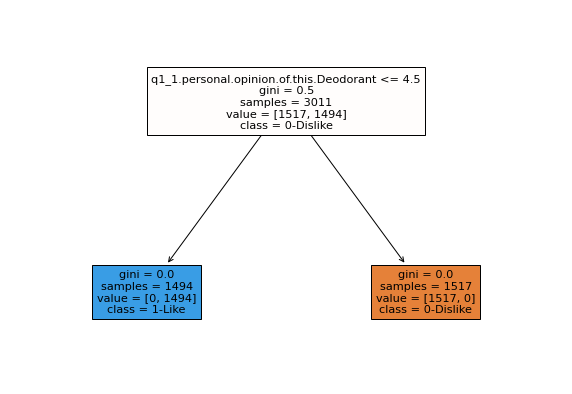

In [110]:
from sklearn import tree

plt.figure(figsize=(10,7))
features = Data_featuresf.columns
classes = ['0-Dislike','1-Like']
tree.plot_tree(Model,feature_names=features,class_names=classes,filled=True)
plt.show()

## Evaluation of classifier

In [114]:
def Confusion_Matrix(C_M):
    group_names  = ['True Negative','False Positive','False Negative','True Positive']
    group_counts = ['{0:0.0f}'.format(value) for value in C_M.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in C_M.flatten()/np.sum(C_M)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(C_M, annot=labels, fmt='', cmap='coolwarm')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels') 
    plt.title('Confusion Matrix')

In [115]:
def Evaluation_of_classifier(y_train, X_train_predicted):
    print('Accuracy :',np.round(accuracy_score(y_train, X_train_predicted),2))
    print('Error Rate :',1-np.round(accuracy_score(y_train, X_train_predicted),2))
    print('Recall or Sensitivity :',recall_score(y_train, X_train_predicted))
    print('Precision :',precision_score(y_train, X_train_predicted))
    print('F1 Score :',f1_score(y_train, X_train_predicted))

### 1. Model evaluation on training data

Accuracy : 1.0
Error Rate : 0.0
Recall or Sensitivity : 1.0
Precision : 1.0
F1 Score : 1.0


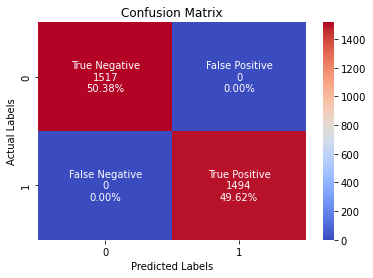

In [116]:
C_M = confusion_matrix(y_train, X_train_predicted) 
Confusion_Matrix(C_M)   

Evaluation_of_classifier(y_train, X_train_predicted)

### 2. Model evaluation on test set data

Accuracy : 1.0
Error Rate : 0.0
Recall or Sensitivity : 1.0
Precision : 1.0
F1 Score : 1.0


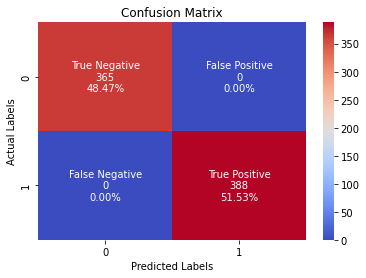

In [117]:
y_predt = Model.predict(X_test)
C_M = confusion_matrix(y_test, y_predt) 
Confusion_Matrix(C_M)

Evaluation_of_classifier(y_test, y_predt)

## Comments :
+ We can see that in our train and test data we have 100 % accuracy. 
+ We can clearly see that the model performing better when fitted with an Unpruned Decision Tree. 
+ For this reason, the tree does not need to be pruned before fitting into the model.

In [118]:
P1 = Model.predict(Unseen_D_f)

Final_Data = Unseen_D_f.copy()
Final_Data['Instant.Liking_DTR'] = P1
Final_Data.head()

,Product.ID,Product,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,q4_5.casual,...,q14.Deodorant.overall.on.a.scale.from.1.to.10,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own,Instant.Liking_DTR
0,0,0,7,2,3,3,1,4,2,3,...,5,7,2,3,2,2,1,0,4,0
1,0,0,6,0,3,2,4,2,1,4,...,10,1,1,4,4,1,1,0,1,0
2,0,0,6,1,3,3,5,3,3,5,...,1,6,1,3,3,1,1,0,6,0
3,0,0,5,1,5,3,4,5,2,5,...,8,2,2,3,10,1,1,0,4,0
4,0,0,6,2,3,2,4,3,1,2,...,4,5,1,2,3,3,1,0,4,0


In [119]:
Final_Data['Instant.Liking_DTR'].value_counts()

0    3791
1    1314
Name: Instant.Liking_DTR, dtype: int64

# 2. The Random Forest Classification 
+ Ensemble-Averaging Method

## Hyper - parameter tuning

### Default parameters in the random forest

In [122]:
from pprint import pprint
rf = RandomForestClassifier(random_state = 42)
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


+ Best parameters to be adjusted :
   - n_estimators = number of trees in the foreset
   - max_features = max number of features considered for splitting a node
   - max_depth = max number of levels in each decision tree
   - min_samples_split = min number of data points placed in a node before the node is split
   - min_samples_leaf = min number of data points allowed in a leaf node
   - bootstrap = method for sampling data points (with or without replacement)

### Random Hyperparameter Grid
+ To use RandomizedSearchCV, we first need to create a parameter grid to sample from during fitting.
+ Randomly sample from the grid, performing K-Fold CV with each combination of values.

In [123]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


+ On each iteration, the algorithm will choose a different combination of the features. 
+ There are 2x12x2x3x3x10 = 4320 different combinations

### RandomSearch Training the model :

In [124]:
rf = RandomForestClassifier()                  # Create the base model to tune

rf_random = RandomizedSearchCV(estimator = rf, 
                               param_distributions = random_grid, 
                               n_iter = 100,   # search across 1000 different combinations, and use all available cores
                               cv = 3,         # Random search of parameters, using 3 fold cross validation
                               verbose=2, 
                               random_state=42, 
                               n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [125]:
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 30,
 'bootstrap': True}

### Evaluate the model

In [126]:
def evaluate(model, X_test, y_test):
    y_predicted = model.predict(X_test)
    print('Accuracy :',100*np.round(accuracy_score(y_test, y_predicted),2),'%')
    print('Error Rate :',100-100*np.round(accuracy_score(y_test, y_predicted),2),'%')
    print('Recall or Sensitivity :',100*recall_score(y_test, y_predicted),'%')
    print('Precision :',100*precision_score(y_test, y_predicted),'%')
    print('F1 Score :',100*f1_score(y_test, y_predicted),'%')
    
    C_M = confusion_matrix(y_test, y_predicted) 
    Confusion_Matrix(C_M)

#### Base model

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %


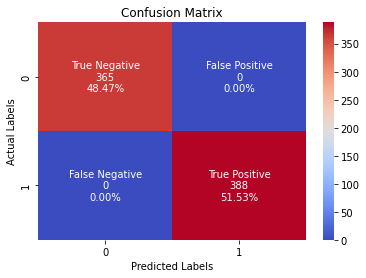

In [127]:
base_model = RandomForestClassifier(n_estimators = 10, random_state = 42)
base_model.fit(X_train, y_train)
evaluate(base_model, X_test, y_test)

#### Random model

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %


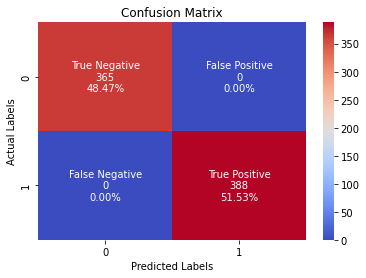

[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.6s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   4.6s
[CV] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   2.2s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   3.4s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   6.0s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1800; total time=   5.6s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   5.4s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.6s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   4.5s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   3.4s
[CV] END bootstrap=False, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=800; total time=   2.7s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.6s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=600; total time=   1.8s
[CV] END bootstrap=False, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=1800; total time=   5.4s
[CV] END bootstrap=False, max_depth=

[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   1.2s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   6.0s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=800; total time=   2.5s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   3.3s
[CV] END bootstrap=False, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=800; total time=   2.8s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.6s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=600; total time=   1.8s
[CV] END bootstrap=True, max_depth=20, 

[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   1.3s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   6.2s
[CV] END bootstrap=False, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1000; total time=   3.7s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   5.4s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=800; total time=   2.4s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1800; total time=   5.3s
[CV] END bootstrap=True, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.8s
[CV] END bootstrap=False, max_depth=3

In [128]:
best_random = rf_random.best_estimator_
evaluate(best_random, X_test, y_test)

### Grid Search with Cross Validation

+ Random search allow us to narrow down the range for each hyperparameter. 
+ GridSearchCV evaluates all combinations. 
+ To use Grid Search make grid based on the best values provided by random search.

In [129]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

# Create a based model
rf = RandomForestClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, 
                           param_grid = param_grid, 
                           cv = 3,
                           n_jobs = -1, 
                           verbose = 2)

#### Best Hyper parameters

In [130]:
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000; total time=   2.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000; total time=   2.4s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100; total time=   0.3s

[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000; total time=   2.6s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_sampl

[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000; total time=   2.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_sampl

[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000; total time=   2.9s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300; total time=   0.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000; total time=   2.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples

[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000; total time=   2.7s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000; total time=   2.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000; total time=   2.5s
[CV] END bootstrap=True, max_depth=80, max_features=2, min_sam

{'bootstrap': True,
 'max_depth': 80,
 'max_features': 2,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 100}

### Evaluate the model

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 99.22680412371135 %
Precision : 100.0 %
F1 Score : 99.61190168175939 %


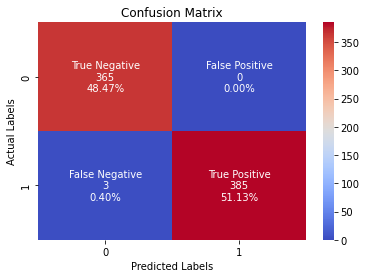

[CV] END bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000; total time=   2.6s
[CV] END bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_sampl

[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.4s
[CV] END bootstrap=True, max_depth=100, max_features=2, m

[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000; total time=   2.4s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000; total time=   2.7s
[CV] END bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000; total time=   3.4s
[CV] END bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300; total time=   0.9s
[CV] END bootstrap=True, max_depth=100, max_features=3,

[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000; total time=   2.5s
[CV] END bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000; total time=   3.5s
[CV] END bootstrap=True, max_depth=100, max_features=3, m

In [131]:
best_grid = grid_search.best_estimator_
evaluate(best_grid, X_test, y_test)

In [133]:
P2 = best_grid.predict(Unseen_D_f)
Final_Data['Instant.Liking_RF'] = P2
Final_Data.head()

,Product.ID,Product,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,q4_5.casual,...,ValSegb,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own,Instant.Liking_DTR,Instant.Liking_RF
0,0,0,7,2,3,3,1,4,2,3,...,7,2,3,2,2,1,0,4,0,0
1,0,0,6,0,3,2,4,2,1,4,...,1,1,4,4,1,1,0,1,0,0
2,0,0,6,1,3,3,5,3,3,5,...,6,1,3,3,1,1,0,6,0,0
3,0,0,5,1,5,3,4,5,2,5,...,2,2,3,10,1,1,0,4,0,0
4,0,0,6,2,3,2,4,3,1,2,...,5,1,2,3,3,1,0,4,0,0


# 3. Naive Bayes

### Building Basic model with default parameters

In [134]:
from sklearn.model_selection import cross_val_score
model = GaussianNB()
cv_scores = cross_val_score(model, X, y, cv=10)
print(model, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

GaussianNB()  mean accuracy:  98.92 % std:  0.043 %


In [135]:
y_pred = model.fit(X_train, y_train).predict(X_test)
print("Number of mislabeled points out of a total %d points : %d" % (X_test.shape[0], (y_test != y_pred).sum()))

Number of mislabeled points out of a total 753 points : 9


### Model Evaluation on the training dataset

Accuracy : 99.0 %
Error Rate : 1.0 %
Recall or Sensitivity : 100.0 %
Precision : 98.80952380952381 %
F1 Score : 99.40119760479043 %


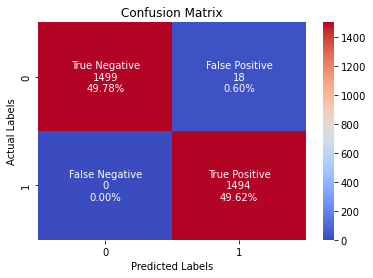

In [136]:
evaluate(model, X_train, y_train)

In [137]:
from sklearn.metrics import classification_report
predict_test = model.predict(X_test)
print(classification_report(y_test,predict_test))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       365
           1       0.98      1.00      0.99       388

    accuracy                           0.99       753
   macro avg       0.99      0.99      0.99       753
weighted avg       0.99      0.99      0.99       753



### ROC Curve

Text(0, 0.5, 'True Positive Rate')

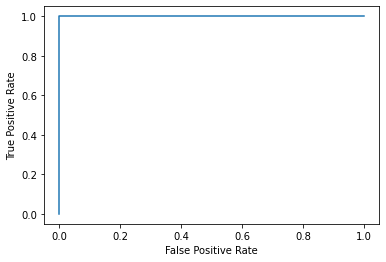

In [138]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_train,model.predict_proba(X_train)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

### Model Evaluation on the test dataset

Accuracy : 99.0 %
Error Rate : 1.0 %
Recall or Sensitivity : 100.0 %
Precision : 97.73299748110831 %
F1 Score : 98.85350318471338 %


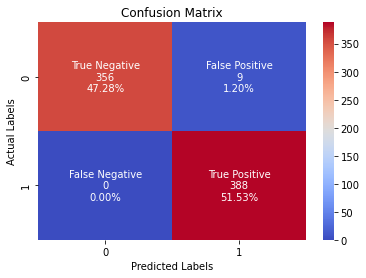

In [139]:
evaluate(model, X_test, y_test)

In [140]:
predict_test = model.predict(X_test)
print(classification_report(y_test,predict_test))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       365
           1       0.98      1.00      0.99       388

    accuracy                           0.99       753
   macro avg       0.99      0.99      0.99       753
weighted avg       0.99      0.99      0.99       753



### ROC Curve

Text(0, 0.5, 'True Positive Rate')

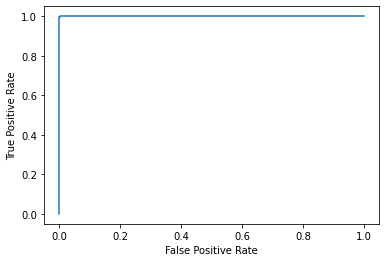

In [141]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_test,model.predict_proba(X_test)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

### Hyperparameter Tuning to improve Accuracy

In [142]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv_method = RepeatedStratifiedKFold(n_splits=5, 
                                    n_repeats=3, 
                                    random_state=999)

In [143]:
from sklearn.preprocessing import PowerTransformer

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

gs_NB = GridSearchCV(estimator=model, 
                     param_grid=params_NB, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(X_train)
gs_NB.fit(X_train,y_train);

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


In [149]:
results_NB = pd.DataFrame(gs_NB.cv_results_['params'])
results_NB['test_score'] = gs_NB.cv_results_['mean_test_score']

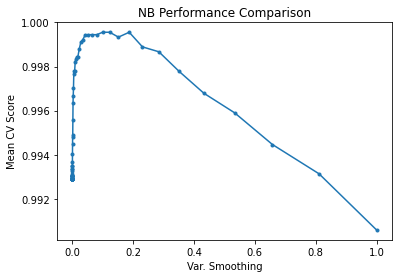

In [150]:
plt.plot(results_NB['var_smoothing'], results_NB['test_score'], marker = '.')    
plt.xlabel('Var. Smoothing')
plt.ylabel("Mean CV Score")
plt.title("NB Performance Comparison")
plt.show()

In [151]:
gs_NB.best_params_

{'var_smoothing': 0.12328467394420659}

In [152]:
gs_NB.best_score_

0.9995572157668652

### Model Evaluation on the train dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %


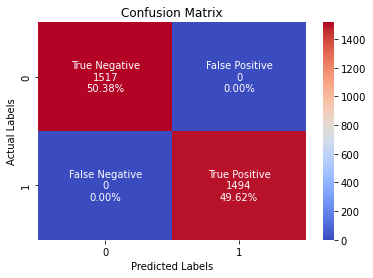

In [153]:
evaluate(gs_NB, X_train, y_train)

In [154]:
predict_train = gs_NB.predict(X_train)
print(classification_report(y_train,predict_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1517
           1       1.00      1.00      1.00      1494

    accuracy                           1.00      3011
   macro avg       1.00      1.00      1.00      3011
weighted avg       1.00      1.00      1.00      3011



### ROC Curve

Text(0, 0.5, 'True Positive Rate')

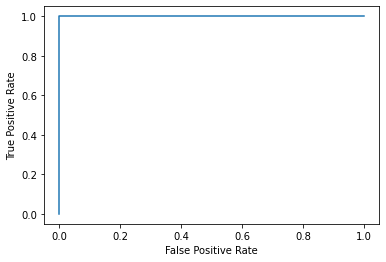

In [155]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_train,gs_NB.predict_proba(X_train)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

### Model Evaluation on the test dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %


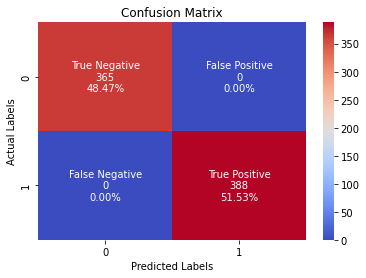

In [156]:
evaluate(gs_NB, X_test, y_test)

In [157]:
predict_test = gs_NB.predict(X_test)
print(classification_report(y_test,predict_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       365
           1       1.00      1.00      1.00       388

    accuracy                           1.00       753
   macro avg       1.00      1.00      1.00       753
weighted avg       1.00      1.00      1.00       753



### ROC curve :


Text(0, 0.5, 'True Positive Rate')

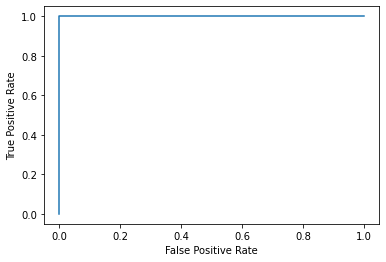

In [158]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_test,gs_NB.predict_proba(X_test)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

In [159]:
P3 = gs_NB.predict(Unseen_D_f)
Final_Data['Instant.Liking_NB'] = P3
Final_Data.head()

,Product.ID,Product,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,q4_5.casual,...,s8.ethnic.background,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own,Instant.Liking_DTR,Instant.Liking_RF,Instant.Liking_NB
0,0,0,7,2,3,3,1,4,2,3,...,2,3,2,2,1,0,4,0,0,0
1,0,0,6,0,3,2,4,2,1,4,...,1,4,4,1,1,0,1,0,0,0
2,0,0,6,1,3,3,5,3,3,5,...,1,3,3,1,1,0,6,0,0,0
3,0,0,5,1,5,3,4,5,2,5,...,2,3,10,1,1,0,4,0,0,0
4,0,0,6,2,3,2,4,3,1,2,...,1,2,3,3,1,0,4,0,0,0


# 4. The Kernel SVM

### Model with tunning hyper-parameters 

In [161]:
svm = SVC()
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf','linear']}
model_svc = GridSearchCV(svm,param_grid)
model_svc.fit(X_train,y_train)
model_svc.best_params_

{'C': 0.1, 'gamma': 1, 'kernel': 'linear'}

In [162]:
model_svc.best_estimator_.get_params()

{'C': 0.1,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 1,
 'kernel': 'linear',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

## Model Evaluation

### Training dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1517
           1       1.00      1.00      1.00      1494

    accuracy                           1.00      3011
   macro avg       1.00      1.00      1.00      3011
weighted avg       1.00      1.00      1.00      3011



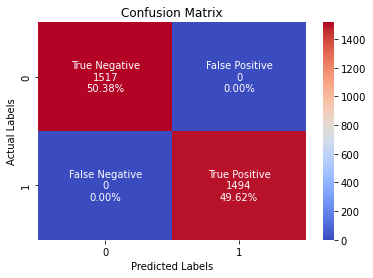

In [163]:
evaluate(model_svc, X_train, y_train)

predict_train = model_svc.predict(X_train)
print('\nClassification Report:\n',classification_report(y_train,predict_train))

### Test Data

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       365
           1       1.00      1.00      1.00       388

    accuracy                           1.00       753
   macro avg       1.00      1.00      1.00       753
weighted avg       1.00      1.00      1.00       753



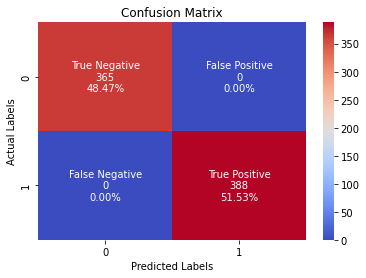

In [164]:
evaluate(model_svc, X_test, y_test)

predict_test = model_svc.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

In [165]:
P4 = model_svc.predict(Unseen_D_f)
Final_Data['Instant.Liking_SVM'] = P4
Final_Data.head()

,Product.ID,Product,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,q4_5.casual,...,s9.education,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own,Instant.Liking_DTR,Instant.Liking_RF,Instant.Liking_NB,Instant.Liking_SVM
0,0,0,7,2,3,3,1,4,2,3,...,3,2,2,1,0,4,0,0,0,0
1,0,0,6,0,3,2,4,2,1,4,...,4,4,1,1,0,1,0,0,0,0
2,0,0,6,1,3,3,5,3,3,5,...,3,3,1,1,0,6,0,0,0,0
3,0,0,5,1,5,3,4,5,2,5,...,3,10,1,1,0,4,0,0,0,0
4,0,0,6,2,3,2,4,3,1,2,...,2,3,3,1,0,4,0,0,0,0


# 5. The Logistic Regression

### Hyper Paramater Tuning

In [167]:
logModel = LogisticRegression()
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [10, 11,25, 50]
    }
]

clf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)
best_clf = clf.fit(X_train,y_train)

Fitting 3 folds for each of 1600 candidates, totalling 4800 fits


/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:8

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: U

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.or

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/s

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: Con

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: Converge

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/s

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: U

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conv

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/s

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pa

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: Conv

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:148

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:8

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:8

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


### Best parameters

In [168]:
best_clf.best_estimator_

LogisticRegression(C=0.0018329807108324356, max_iter=10, penalty='l1',
                   solver='saga')

## Model evaluation

### Training dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1517
           1       1.00      1.00      1.00      1494

    accuracy                           1.00      3011
   macro avg       1.00      1.00      1.00      3011
weighted avg       1.00      1.00      1.00      3011



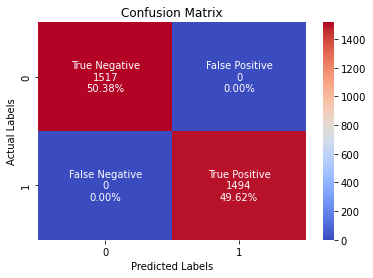

In [169]:
evaluate(best_clf, X_train, y_train)

predict_train = best_clf.predict(X_train)
print('\nClassification Report:\n',classification_report(y_train,predict_train))

### Test dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       365
           1       1.00      1.00      1.00       388

    accuracy                           1.00       753
   macro avg       1.00      1.00      1.00       753
weighted avg       1.00      1.00      1.00       753



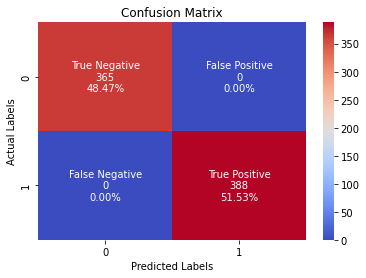

In [170]:
evaluate(best_clf, X_test, y_test)

predict_test = best_clf.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

In [171]:
P5 = model_svc.predict(Unseen_D_f)
Final_Data['Instant.Liking_LR'] = P5
Final_Data.head()

,Product.ID,Product,q1_1.personal.opinion.of.this.Deodorant,q2_all.words,q3_1.strength.of.the.Deodorant,q4_1.artificial.chemical,q4_2.attractive,q4_3.bold,q4_4.boring,q4_5.casual,...,s10.income,s11.marital.status,s12.working.status,s13a.b.most.often,s13b.bottles.of.Deodorant.do.you.currently.own,Instant.Liking_DTR,Instant.Liking_RF,Instant.Liking_NB,Instant.Liking_SVM,Instant.Liking_LR
0,0,0,7,2,3,3,1,4,2,3,...,2,2,1,0,4,0,0,0,0,0
1,0,0,6,0,3,2,4,2,1,4,...,4,1,1,0,1,0,0,0,0,0
2,0,0,6,1,3,3,5,3,3,5,...,3,1,1,0,6,0,0,0,0,0
3,0,0,5,1,5,3,4,5,2,5,...,10,1,1,0,4,0,0,0,0,0
4,0,0,6,2,3,2,4,3,1,2,...,3,3,1,0,4,0,0,0,0,0


<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">7. Ensemble Technique </p>
+ To boost the model accuracy
+ It helps improve results by combining several models to improve predictive performance compared to a single model 

# Max Voting Classifier 

+ The idea is instead of creating separate dedicated models and finding the accuracy for each them, we create a single model which trains by these models and predicts output based on their combined majority of voting for each output class.

+ In this technique, multiple models are used to make predictions for each data point. The predictions by each model are considered as a ‘vote’. The predictions which we get from the majority of the models are used as the final prediction.

+ A **Voting Classifier** is a machine learning model that trains on an ensemble of numerous models and predicts an output (class) based on their highest probability of chosen class as the output.

### Ensemble of Models 

In [179]:
estimator = [] 
estimator.append(('Support Vector Classifier', model_svc)) 
estimator.append(('Decision Tree  Classifier', Model)) 
estimator.append(('Random Forest Classifier', best_grid)) 
estimator.append(('Logistic Regression Classifier', best_clf)) 
estimator.append(('Naive Bayes Classifier', gs_NB)) 
estimator

[('Support Vector Classifier',
  GridSearchCV(estimator=SVC(),
               param_grid={'C': [0.1, 1, 10, 100, 1000],
                           'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                           'kernel': ['rbf', 'linear']})),
 ('Decision Tree  Classifier', DecisionTreeClassifier(max_depth=2)),
 ('Random Forest Classifier',
  RandomForestClassifier(max_depth=80, max_features=2, min_samples_leaf=3,
                         min_samples_split=8)),
 ('Logistic Regression Classifier',
  GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
               param_grid=[{'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
         4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
         2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
         1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
         5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                            'max_i

# 1. Hard Voting: 
  + In hard voting, the predicted output class is a class with the highest majority of votes i.e the class which had the highest probability of being predicted by each of the classifiers. 
  + Suppose three classifiers predicted the output class(A, A, B), so here the majority predicted A as output. Hence A will be the final prediction. 

In [180]:
hard_voting = VotingClassifier(estimators = estimator, voting ='hard') 
hard_voting.fit(X_train, y_train) 
y_pred = hard_voting.predict(X_test)   

Fitting 3 folds for each of 1600 candidates, totalling 4800 fits


/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pa

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    http

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/skl

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: Con

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:8

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://sc

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:148

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:8

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklea

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: Convergenc

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


### Evaluating Result on Test Data Set

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       365
           1       1.00      1.00      1.00       388

    accuracy                           1.00       753
   macro avg       1.00      1.00      1.00       753
weighted avg       1.00      1.00      1.00       753



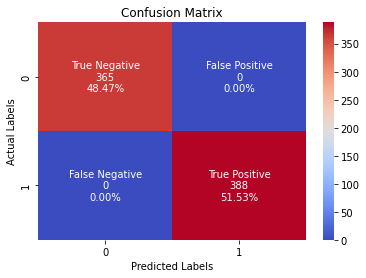

In [181]:
evaluate(hard_voting, X_test, y_test)
predict_test = hard_voting.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

# 2. Soft Voting : 
+ The output class is the prediction based on the average of probability given to that class. 
+ Suppose given some input to three models, the prediction probability for class A = (0.30, 0.47, 0.53) and B = (0.20, 0.32, 0.40). 
+ So the average for class A is 0.4333 and B is 0.3067, the winner is clearly class A because it had the highest probability averaged by each classifier.

In [190]:
estimator = [] 
estimator.append(('Decision Tree  Classifier', Model)) 
estimator.append(('Random Forest Classifier', best_grid)) 
estimator.append(('Logistic Regression Classifier', best_clf)) 
estimator.append(('Naive Bayes Classifier', gs_NB))
estimator

[('Decision Tree  Classifier', DecisionTreeClassifier(max_depth=2)),
 ('Random Forest Classifier',
  RandomForestClassifier(max_depth=80, max_features=2, min_samples_leaf=3,
                         min_samples_split=8)),
 ('Logistic Regression Classifier',
  GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
               param_grid=[{'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
         4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
         2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
         1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
         5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                            'max_iter': [10, 11, 25, 50],
                            'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                            'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                       'saga']}],
               v

In [191]:
soft_voting = VotingClassifier(estimators = estimator, voting ='soft') 
soft_voting.fit(X_train, y_train) 
y_pred = soft_voting.predict(X_test) 

Fitting 3 folds for each of 1600 candidates, totalling 4800 fits


/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: Con

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-le

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) o

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pa

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pa

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    http

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/s

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/skl

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:148

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: C

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:148

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-pack

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    http

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/sit

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: Convergenc

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packag

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: U

/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/home/jai_bhawani/anaconda3/lib/python3.9/site-

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


### Model evaluation on the training dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1517
           1       1.00      1.00      1.00      1494

    accuracy                           1.00      3011
   macro avg       1.00      1.00      1.00      3011
weighted avg       1.00      1.00      1.00      3011



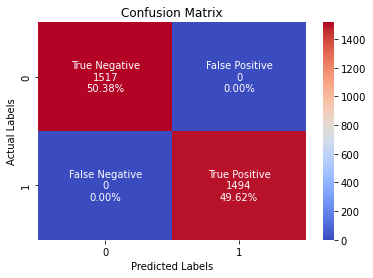

In [192]:
evaluate(soft_voting, X_train, y_train)
predict_train = soft_voting.predict(X_train)
print('\nClassification Report:\n',classification_report(y_train,predict_train))

### Model evaluation on the testing dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       365
           1       1.00      1.00      1.00       388

    accuracy                           1.00       753
   macro avg       1.00      1.00      1.00       753
weighted avg       1.00      1.00      1.00       753



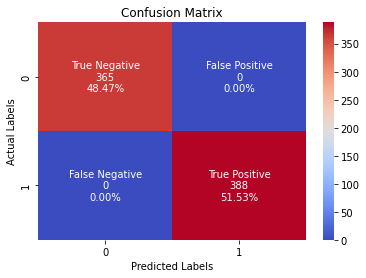

In [193]:
evaluate(soft_voting, X_test, y_test)
predict_test = soft_voting.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

# 3. Averaging

+ Multiple predictions are made for each data point in averaging. 
+ Averaging can be used for while calculating probabilities for classification problems.

In [194]:
# Root Mean Square Error 
def rmse_cv(model,X,y):
    rmse = np.sqrt(-cross_val_score(model,X,y,scoring="neg_mean_squared_error",cv=5))
    return rmse

+ We choose 4 models and use 5-folds cross-calidation to evaluate these models.
+ Models include:
  - Support Vector Classifier
  - Decision Tree  Classifier
  - Random Forest Classifier
  - Naive Bayes Classifier

In [196]:
models = [model_svc,
          Model,
          best_grid,
          gs_NB
         ]

names = ['Support Vector Classifier',
         'Decision Tree  Classifier',
         'Random Forest Classifier',
         'Naive Bayes Classifier']

In [197]:
for model,name in zip(models,names):
    score = rmse_cv(model,X_train,y_train)
    print("{}: {:.6f}, {:4f}".format(name,score.mean(),score.std()))

Support Vector Classifier: 0.000000, 0.000000
Decision Tree  Classifier: 0.000000, 0.000000
Random Forest Classifier: 0.008151, 0.016303
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Naive Bayes Classifier: 0.000000, 0.000000


### To define the average weight 

In [198]:
class AverageWeight(BaseEstimator, RegressorMixin):
    def __init__(self,model,weight):
        self.model = model
        self.weight = weight
        
    def fit(self,X,y):
        self.models_ = [clone(x) for x in self.model]
        for model in self.models_:
            model.fit(X,y)
        return self
    
    def predict(self,X):
        w = list()
        pred = np.array([model.predict(X) for model in self.models_])
        
        # For every data point, single model prediction times weight, then add them together
        for data in range(pred.shape[1]):
            single = [pred[model,data]*weight for model,weight in zip(range(pred.shape[0]),self.weight)]
            w.append(np.sum(single))
        return w

### Using four models 

In [200]:
# Assign weights to all the above 4 models
w1 = 0.12
w2 = 0.32
w3 = 0.21
w4 = 0.15

weight_avg = AverageWeight(model = [model_svc,           # Support Vector Classifier
                                    Model,           # Decision Tree Classifier
                                    best_grid,        # Random Forest Classifier
                                    gs_NB],           # Naive Bayes Classifier
                           weight=[w1,w2,w3,w4])         
score = rmse_cv(weight_avg,X_train,y_train)
print(score.mean())

Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
0.1412133504032366


### Using three models 

In [202]:
weight_avg = AverageWeight(model = [model_svc,           # Support Vector Classifier
                                    Model,           # Decision Tree Classifier
                                    best_grid],       # Random Forest Classifier           
                           weight=[w1,w2,w3])         
score = rmse_cv(weight_avg,X_train,y_train)
print(score.mean())

0.2465098829570221


### Using two models

In [203]:
weight_avg = AverageWeight(model = [best_grid,        # Random Forest Classifier
                                    Model],          # Decision Tree Classifier         
                           weight=[w1,w2])         
score = rmse_cv(weight_avg,X_train,y_train)
print(score.mean())

0.39447790113601944


+ Weighted averaging is a slightly modified version of simple averaging, where the prediction of each model is multiplied by the weight and then their average is calculated.

# 4. Bagging 
+ Bagging is shorthand for the combination of bootstrapping and aggregating. 
+ Bootstrapping is a method to help decrease the variance of the classifier and reduce overfitting, by resampling data from the training set with the same cardinality as the original set. 
+ The model created should be less overfitted than a single individual model.
+ Bagging is an effective method when limited data, and by using samples able to get an estimate by aggregating the scores over many samples.

+ Once the bagging is done, and all the models have been created on (mostly) different data, a weighted average is then used to determine the final score.
+ Bagging (or Bootstrap Aggregating) technique uses these subsets (bags) to get a fair idea of the distribution (complete set). The size of subsets created for bagging may be less than the original set.
#### Steps:
  - Step 1: Multiple subsets are created from the original dataset, selecting observations with replacement.
  - Step 2: A base model (weak model) is created on each of these subsets.
  - Step 3: The models run in parallel and are independent of each other.
  - Step 4: The final predictions are determined by combining the predictions from all the models.

In [204]:
clf_array = [Model, best_grid]
for clf in clf_array:
    vanilla_scores = cross_val_score(clf, X, y, cv=10, n_jobs=-1)
    bagging_clf    = BaggingClassifier(clf,max_samples=0.4, max_features=10, random_state=0)
    bagging_scores = cross_val_score(bagging_clf, X, y, cv=10,n_jobs=-1)
    
    print ("Mean of: {1:.3f}, std: (+/-) {2:.3f} [{0}]".format(clf.__class__.__name__,vanilla_scores.mean(), vanilla_scores.std()))
    print ("Mean of: {1:.3f}, std: (+/-) {2:.3f} [Bagging {0}]\n".format(clf.__class__.__name__,bagging_scores.mean(), bagging_scores.std()))

Mean of: 1.000, std: (+/-) 0.000 [DecisionTreeClassifier]
Mean of: 0.753, std: (+/-) 0.002 [Bagging DecisionTreeClassifier]

Mean of: 0.911, std: (+/-) 0.051 [RandomForestClassifier]
Mean of: 0.753, std: (+/-) 0.002 [Bagging RandomForestClassifier]



+ The result shows that for same classifiers with bagging, we get lower variance.
+ Lower Variance implies Lower Overfitting. 
+ Looks like this bagging thing actually works. 

# 5. Boosting
+ The main idea of boosting is to add additional models to the overall ensemble model sequentially. 
+ Previously with bagging, we averaged each individual model created. 
+ This time with each iteration of boosting, a new model is created and the new base-learner model is trained (updated) from the errors of the previous learners.
+ The gradient descent optimization occurs on the output of the varies models, and not their individual parameters.
+ Each new subset which is iterated upon contains elements which could have been misclassified by previous models. 
+ AdaBoost is one of the simplest boosting algorithms. Usually, decision trees are used for modelling. 
+ Multiple sequential models are created, each correcting the errors from the last model. 
+ AdaBoost assigns weights to the observations which are incorrectly predicted and the subsequent model works to predict these values correctly.

### Steps :
* Initially, all observations in the dataset are given equal weights.
* A model is built on a subset of data.
* Using this model, predictions are made on the whole dataset.
* Errors are calculated by comparing the predictions and actual values.
* While creating the next model, higher weights are given to the data points which were predicted incorrectly.
* Weights can be determined using the error value. For instance, higher the error more is the weight assigned to the observation.
* This process is repeated until the error function does not change, or the maximum limit of the number of estimators is reached.

In [207]:
ada_boost = AdaBoostClassifier(random_state=1)
ada_boost.fit(X_train, y_train)

AdaBoostClassifier(random_state=1)

### Model evaluation on the testing dataset

Accuracy : 100.0 %
Error Rate : 0.0 %
Recall or Sensitivity : 100.0 %
Precision : 100.0 %
F1 Score : 100.0 %

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       365
           1       1.00      1.00      1.00       388

    accuracy                           1.00       753
   macro avg       1.00      1.00      1.00       753
weighted avg       1.00      1.00      1.00       753



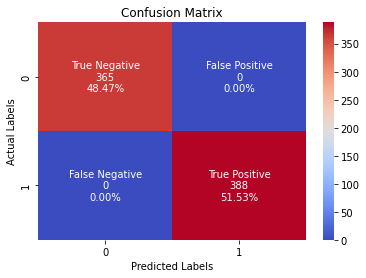

In [208]:
evaluate(ada_boost, X_test, y_test)
predict_test = ada_boost.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

<a id="1"></a>
## <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">8. Comparing the accuracy of all the Classifiers </p>

Text(0, 0.5, 'Percentage Accuracy achieved')

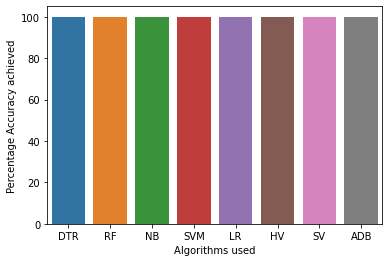

In [211]:
Algo = ['DTR','RF','NB','SVM','LR','HV','SV','ADB']
Acur = [100,100,100,100,100,100,100,100]
sns.barplot(Algo,Acur)
plt.xlabel('Algorithms used')
plt.ylabel('Percentage Accuracy achieved')

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;"> The End </p>